<a href="https://colab.research.google.com/github/anaacapilla/MIA3/blob/main/gan_EJERCICIO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<font color="#CA0032"><h1 align="left">**Redes Generativas Adversariales (GANs)**</h1></font>

<font color="#6E6E6E"><h1 align="left">**Creación de imágenes nuevas**</h1></font>

<h2 align="left">Manuel Sánchez-Montañés</h2>

<font color="#6E6E6E"><h2 align="left">manuel.smontanes@gmail.com</h2></font>

In [18]:
COLAB                  = True
SAVE_INTERMEDIATE_DATA = False

In [19]:
if COLAB:
    %tensorflow_version 1.x
    !pip install h5py==2.10.0

import os
#os.environ["KERAS_BACKEND"] = "tensorflow"
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

from keras.layers import Input
from keras.models import Model, Sequential
from keras.layers.core import Reshape, Dense, Dropout, Flatten
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.normalization import BatchNormalization
from keras.datasets import fashion_mnist as fashion
from keras.optimizers import Adam
from keras import backend as K
from keras import initializers

%matplotlib inline

In [20]:
# Deterministic output.
# Tired of seeing the same results every time? Remove the line below.
np.random.seed(1000)

# The results are a little better when the dimensionality of the random vector is only 10.
# The dimensionality has been left at 100 for consistency with other GAN implementations.
# Espacio latente
randomDim = 20

# Load Fashion data
(X_train, y_train), (X_test, y_test) = fashion.load_data()
X_train = X_train.astype(np.float32) / 255 # para que esté entre 0 y 1
X_train = 2*X_train - 1 # para que esté entre -1 y 1
X_train = X_train.reshape(-1, 28*28)

X_train = X_train[y_train>=5] # para simplificar se entrena sólo con los dígitos 5,6,7,8,9
y_train = y_train[y_train>=5] # ídem

In [21]:
X_train.shape

(30000, 784)

In [22]:
X_train.min(), X_train.max()

(-1.0, 1.0)

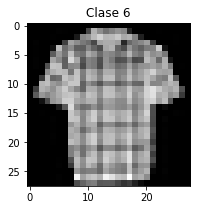

In [23]:
ind = 100
plt.figure(figsize=(3,3))
plt.imshow(X_train[ind].reshape(28,28), cmap="gray")
plt.title("Clase {}".format(y_train[ind]));

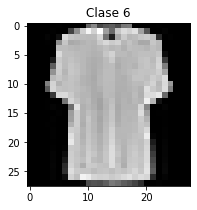

In [24]:
ind = 202
plt.figure(figsize=(3,3))
plt.imshow(X_train[ind].reshape(28,28), cmap="gray")
plt.title("Clase {}".format(y_train[ind]));

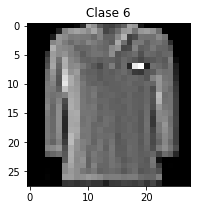

In [25]:
ind = 20000
plt.figure(figsize=(3,3))
plt.imshow(X_train[ind].reshape(28,28), cmap="gray")
plt.title("Clase {}".format(y_train[ind]));

In [26]:
X_train.shape

(30000, 784)

**Optimizador**

In [27]:
adam_gen  = Adam(lr=0.0002, beta_1=0.5) # por defecto: 0.001
adam_disc = Adam(lr=0.0002/2, beta_1=0.5)

In [11]:
X_train.shape

(30000, 784)

**Red generadora ("generator")**

In [28]:
randomDim # tamaño del espacio latente

20

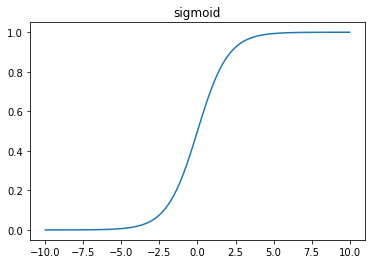

In [29]:
def sigmoid(z):
    return 1 / (1 + np.exp(-z))

x = np.linspace(-10, 10, 100)
plt.plot(x, sigmoid(x))
plt.title("sigmoid");

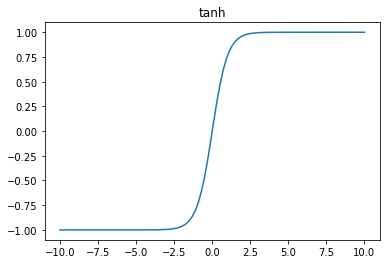

In [14]:
x = np.linspace(-10, 10, 100)
plt.plot(x, np.tanh(x))
plt.title("tanh");

In [ ]:
# ReLU(z) = max(0,z)
#
# LeakyReLU(z,0.2):
#   si z>0, salida = z
#   si z<=0, salida = -0.2*abs(z)

In [ ]:
# tanh(z) = 2*sigmoide(z) - 1

In [15]:
def relu(z):
    return z*(z>0)

def leakyrelu(z):
    return z*(z>0) - 0.2*np.abs(z)*(z<0)

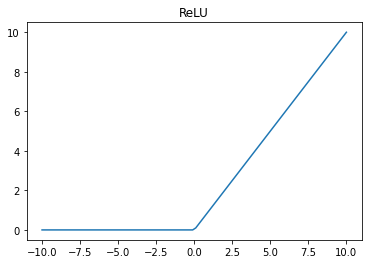

In [16]:
z = np.linspace(-10,10,100)
plt.plot(z, relu(z))
plt.title("ReLU");

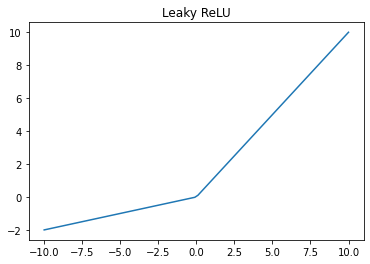

In [17]:
z = np.linspace(-10,10,100)
plt.plot(z, leakyrelu(z))
plt.title("Leaky ReLU");

In [30]:
# entrada: randomDim dimensiones
# salida:  784 valores (entre -1 y 1)
#
# Función de activación estándar en DL:
# ReLU(x): max(0,x)
# En GANs:
# LeakyReLU(x,0.2):
#     si x>0: salida = x
#     si x<0: salida = 0.2*x = -0.2*abs(x)

# generador "Naïve" lineal
# generator = Sequential()
# generator.add(Dense(28*28, input_shape=(randomDim,), activation="tanh"))
# generator.summary()


generator = Sequential()
generator.add(Dense(64, input_shape=(randomDim,))) # entrada: 20 valores
generator.add(LeakyReLU(0.2))
generator.add(Dense(128))
generator.add(LeakyReLU(0.2))
generator.add(Dense(28*28, activation="tanh")) # salida: 784 valores
# generator.compile(loss="binary_crossentropy", optimizer=adam_gen) # INNECESARIO
generator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 64)                1344      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 64)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               8320      
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 128)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 784)               101136    
Total params: 110,800
Trainable params: 110,800
Non-trainable params: 0
_________________________________________________________________


In [ ]:
type( (20) ), type( (20,))

(int, tuple)

**Red discriminadora ("discriminator")**

In [ ]:
(28*28,)

(784,)

In [31]:
discriminator = Sequential()

discriminator.add(Dense(128, input_shape=(28*28,)))
discriminator.add(LeakyReLU(0.2))
discriminator.add(Dropout(0.3))

discriminator.add(Dense(64))
discriminator.add(LeakyReLU(0.2))
discriminator.add(Dropout(0.3))

discriminator.add(Dense(1, activation="sigmoid"))
discriminator.compile(loss="binary_crossentropy", optimizer=adam_disc)

discriminator.summary()

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 128)               100480    
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 128)               0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 64)                8256      
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 64)                0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 64)                0         
__________________________

**Sistema combinado (GAN) generador+discriminador congelado**

In [32]:
# rellenar

discriminator.trainable = False
ganInput  = Input(shape=(randomDim,))
ganOutput = discriminator(generator(ganInput))
gan = Model(inputs=ganInput, outputs=ganOutput)
gan.compile(loss="binary_crossentropy", optimizer=adam_gen)
gan.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 20)                0         
_________________________________________________________________
sequential_1 (Sequential)    (None, 784)               110800    
_________________________________________________________________
sequential_2 (Sequential)    (None, 1)                 108801    
Total params: 219,601
Trainable params: 110,800
Non-trainable params: 108,801
_________________________________________________________________


In [33]:
# Plot the loss from each batch
def plotLoss(epoch):
    plt.figure(figsize=(10, 3))
    plt.plot(range(1,len(dLosses)+1), dLosses,
             label='Discriminitive loss', linewidth=3)
    plt.plot(range(1,len(gLosses)+1), gLosses,
             label='Generative loss', linewidth=3)
    plt.xlabel('Epoch', fontsize=16)
    plt.ylabel('Loss', fontsize=16)
    plt.legend(fontsize=14)
    if not COLAB:
        plt.savefig('./images/gan_loss_epoch_{}.png'.format(epoch))
    plt.show()

# Create a wall of generated images
def plotGeneratedImages(epoch, examples=100,
                        dim=(10, 10), figsize=(10, 10)):
    noise = np.random.normal(0, 1, size=[examples, randomDim])
    generatedImages = generator.predict(noise)
    generatedImages = generatedImages.reshape(examples, 28, 28)

    plt.figure(figsize=figsize)
    for i in range(len(generatedImages)):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generatedImages[i], interpolation='nearest', cmap='gray_r')
        plt.axis('off')
    plt.tight_layout()
    if SAVE_INTERMEDIATE_DATA:
        plt.savefig('./images/gan_generated_image_epoch_{}.png'.format(epoch))
    plt.show()


def plotImages(images, nrows, ncols, figsize):
    plt.figure(figsize=figsize)
    for i in range(images.shape[0]):
        plt.subplot(nrows, ncols, i+1)
        plt.imshow(images[i].reshape(28,28), interpolation='nearest', cmap='gray_r')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

    
# Save the generator and discriminator networks (and weights) for later use
def saveModels(epoch):
    generator.save('./models/gan_generator_epoch_{}.h5'.format(epoch))
    discriminator.save('./models/gan_discriminator_epoch_{}.h5'.format(epoch))

In [34]:
if SAVE_INTERMEDIATE_DATA:
    os.makedirs("./images", exist_ok=True)
    os.makedirs("./models", exist_ok=True)

In [35]:
len(X_train)

30000

In [36]:
dLosses = [] # histórico de los valores de la función de coste del discriminador
gLosses = [] # histórico de los valores de la función de coste del generador

In [37]:
epochs = 200
batchSize=128

batchCount = len(X_train) // batchSize
batchCount

234

In [ ]:
print(128*[1])

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


In [ ]:
print(128*[0])

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [ ]:
print( 128*[1] + 128*[0] )

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


Epochs: 200
Batch size: 128
Batches per epoch: 234
--------------- Epoch 1 ---------------


  0%|          | 0/234 [00:00<?, ?it/s]

100%|██████████| 234/234 [00:09<00:00, 25.70it/s]


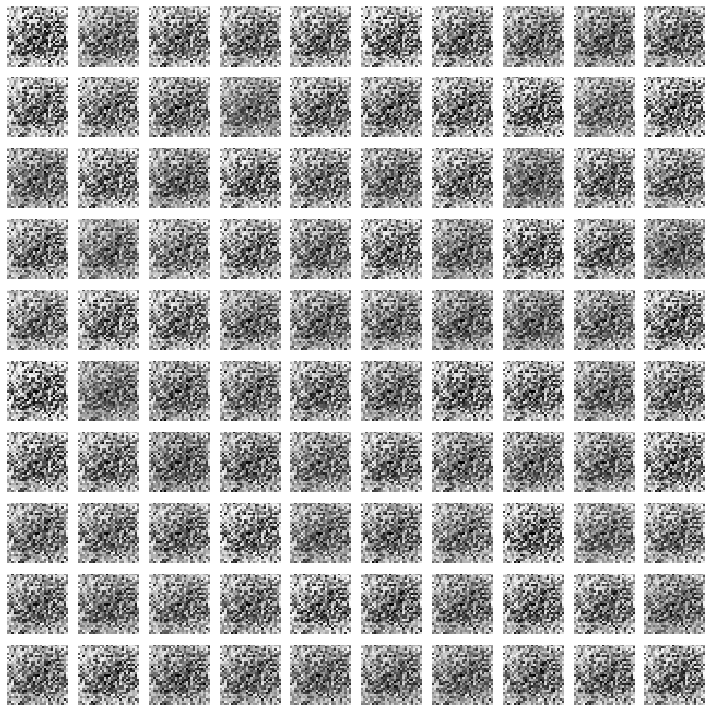

--------------- Epoch 2 ---------------


100%|██████████| 234/234 [00:03<00:00, 72.70it/s]


--------------- Epoch 3 ---------------


100%|██████████| 234/234 [00:03<00:00, 74.71it/s]


--------------- Epoch 4 ---------------


100%|██████████| 234/234 [00:03<00:00, 73.26it/s]


--------------- Epoch 5 ---------------


100%|██████████| 234/234 [00:03<00:00, 74.44it/s]


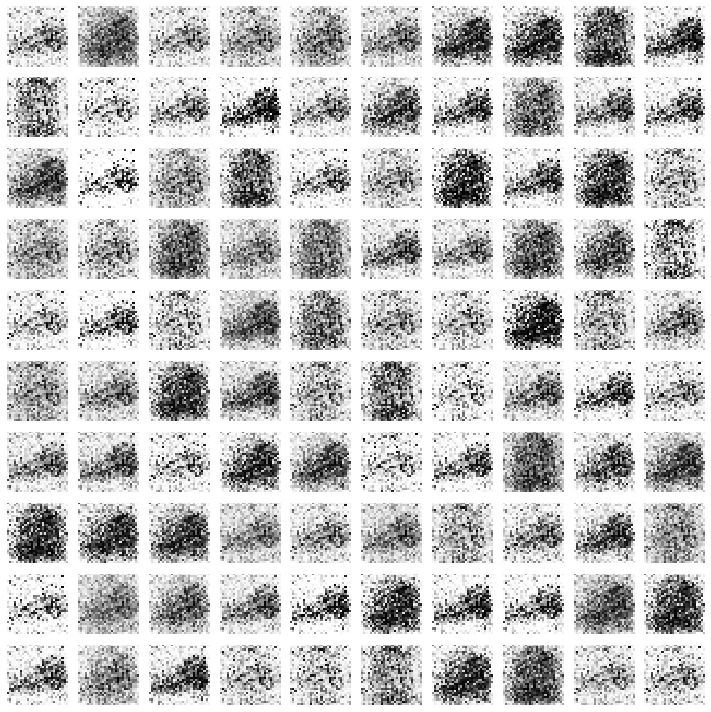

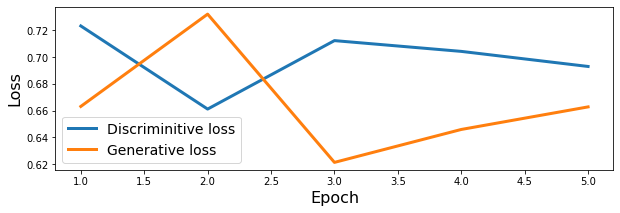

--------------- Epoch 6 ---------------


100%|██████████| 234/234 [00:03<00:00, 73.14it/s]


--------------- Epoch 7 ---------------


100%|██████████| 234/234 [00:03<00:00, 71.84it/s]


--------------- Epoch 8 ---------------


100%|██████████| 234/234 [00:03<00:00, 72.59it/s]


--------------- Epoch 9 ---------------


100%|██████████| 234/234 [00:03<00:00, 74.11it/s]


--------------- Epoch 10 ---------------


100%|██████████| 234/234 [00:03<00:00, 72.91it/s]


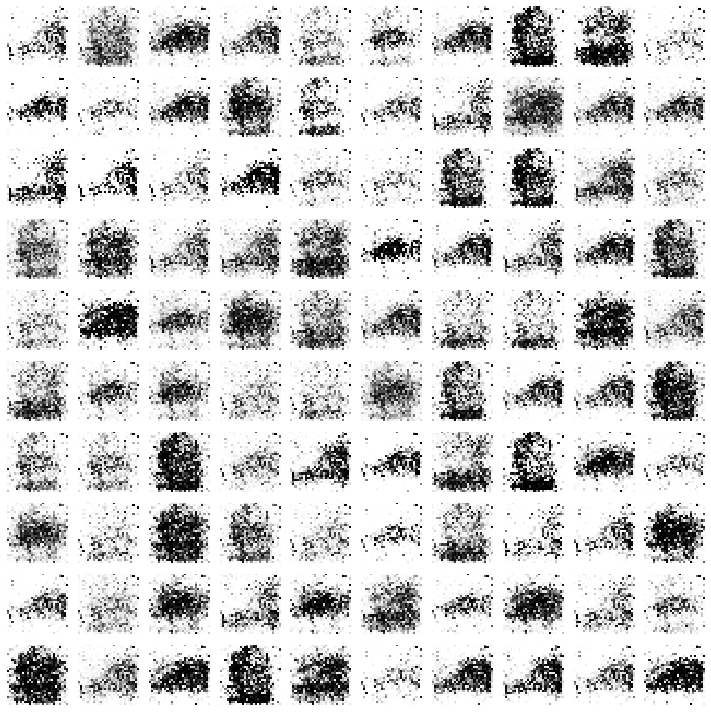

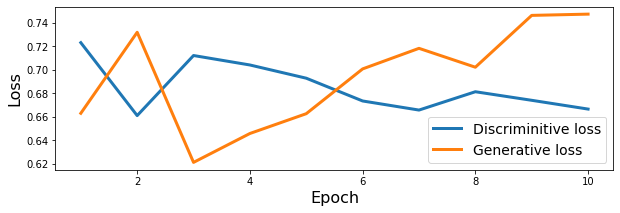

--------------- Epoch 11 ---------------


100%|██████████| 234/234 [00:03<00:00, 72.63it/s]


--------------- Epoch 12 ---------------


100%|██████████| 234/234 [00:03<00:00, 68.18it/s]


--------------- Epoch 13 ---------------


100%|██████████| 234/234 [00:03<00:00, 67.12it/s]


--------------- Epoch 14 ---------------


100%|██████████| 234/234 [00:03<00:00, 66.91it/s]


--------------- Epoch 15 ---------------


100%|██████████| 234/234 [00:03<00:00, 66.55it/s]


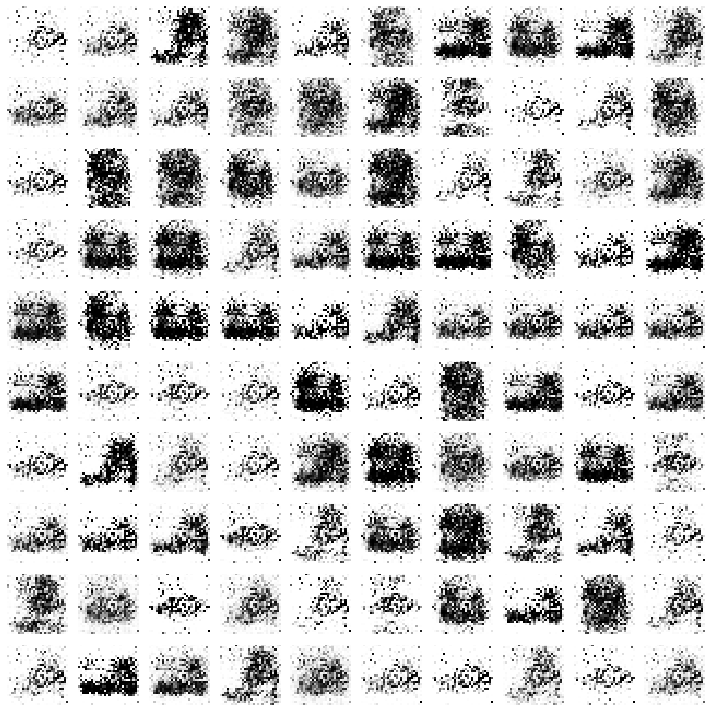

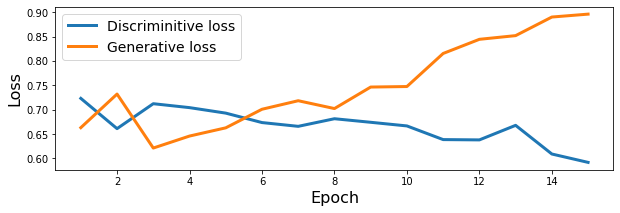

--------------- Epoch 16 ---------------


100%|██████████| 234/234 [00:03<00:00, 69.93it/s]


--------------- Epoch 17 ---------------


100%|██████████| 234/234 [00:03<00:00, 71.69it/s]


--------------- Epoch 18 ---------------


100%|██████████| 234/234 [00:03<00:00, 71.00it/s]


--------------- Epoch 19 ---------------


100%|██████████| 234/234 [00:03<00:00, 71.24it/s]


--------------- Epoch 20 ---------------


100%|██████████| 234/234 [00:03<00:00, 70.01it/s]


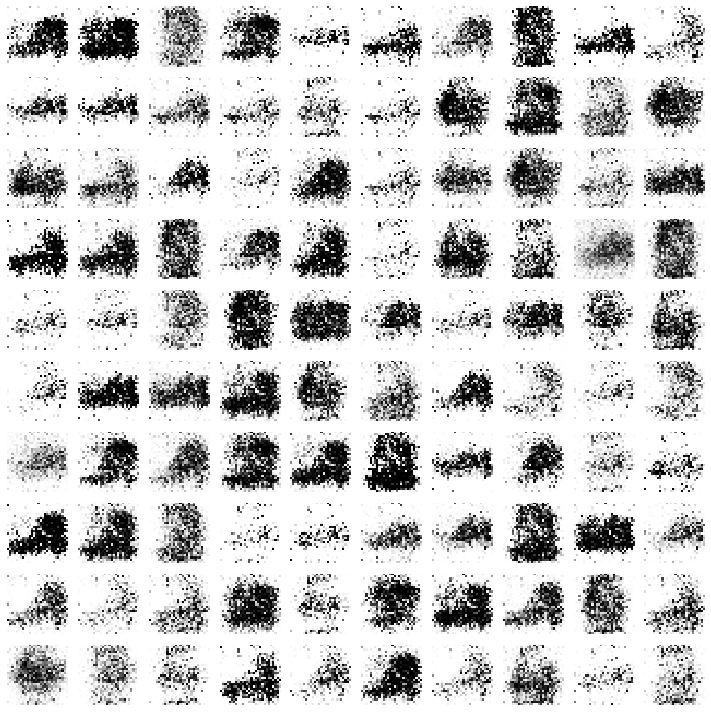

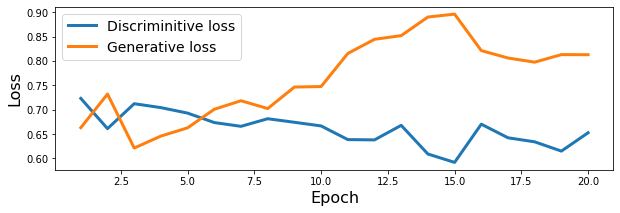

--------------- Epoch 21 ---------------


100%|██████████| 234/234 [00:03<00:00, 67.94it/s]


--------------- Epoch 22 ---------------


100%|██████████| 234/234 [00:03<00:00, 68.86it/s]


--------------- Epoch 23 ---------------


100%|██████████| 234/234 [00:03<00:00, 69.77it/s]


--------------- Epoch 24 ---------------


100%|██████████| 234/234 [00:03<00:00, 68.34it/s]


--------------- Epoch 25 ---------------


100%|██████████| 234/234 [00:03<00:00, 68.73it/s]


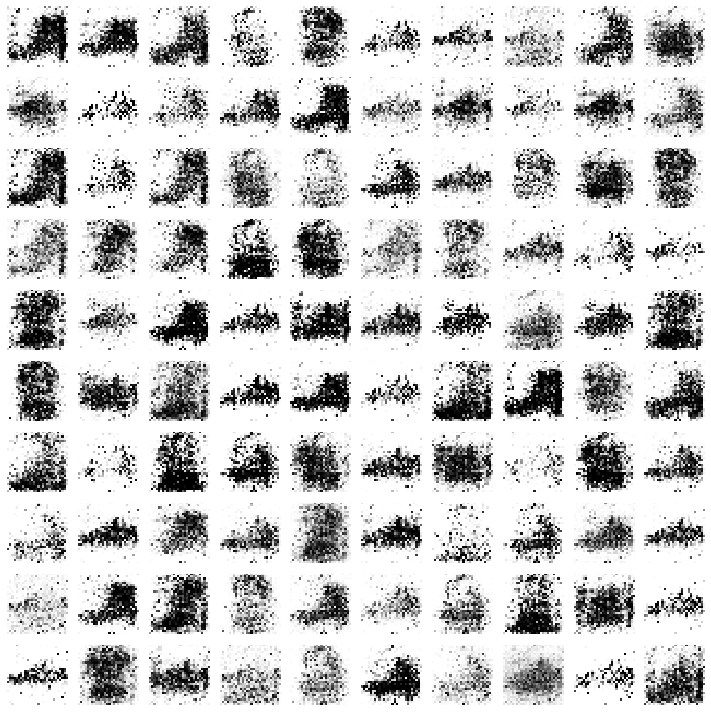

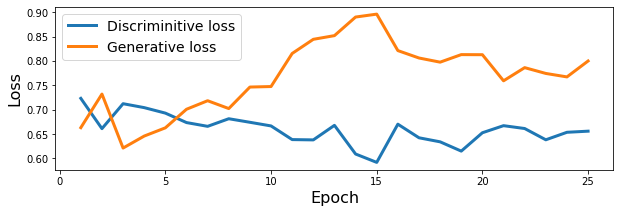

--------------- Epoch 26 ---------------


100%|██████████| 234/234 [00:03<00:00, 69.31it/s]


--------------- Epoch 27 ---------------


100%|██████████| 234/234 [00:03<00:00, 69.74it/s]


--------------- Epoch 28 ---------------


100%|██████████| 234/234 [00:03<00:00, 68.36it/s]


--------------- Epoch 29 ---------------


100%|██████████| 234/234 [00:03<00:00, 68.43it/s]


--------------- Epoch 30 ---------------


100%|██████████| 234/234 [00:03<00:00, 66.86it/s]


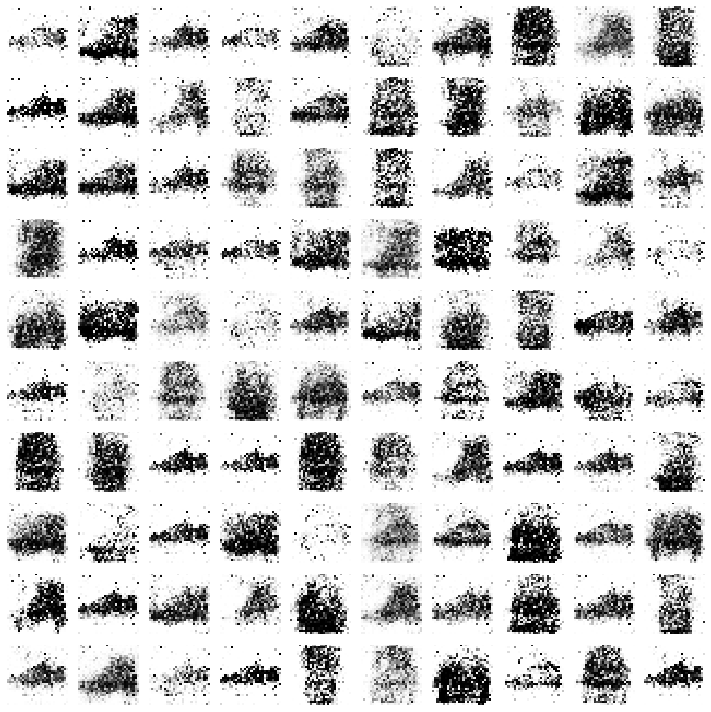

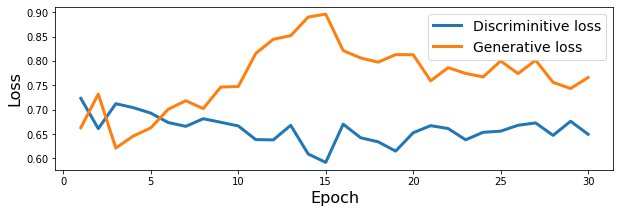

--------------- Epoch 31 ---------------


100%|██████████| 234/234 [00:03<00:00, 67.51it/s]


--------------- Epoch 32 ---------------


100%|██████████| 234/234 [00:03<00:00, 68.38it/s]


--------------- Epoch 33 ---------------


100%|██████████| 234/234 [00:03<00:00, 68.17it/s]


--------------- Epoch 34 ---------------


100%|██████████| 234/234 [00:03<00:00, 68.54it/s]


--------------- Epoch 35 ---------------


100%|██████████| 234/234 [00:03<00:00, 68.01it/s]


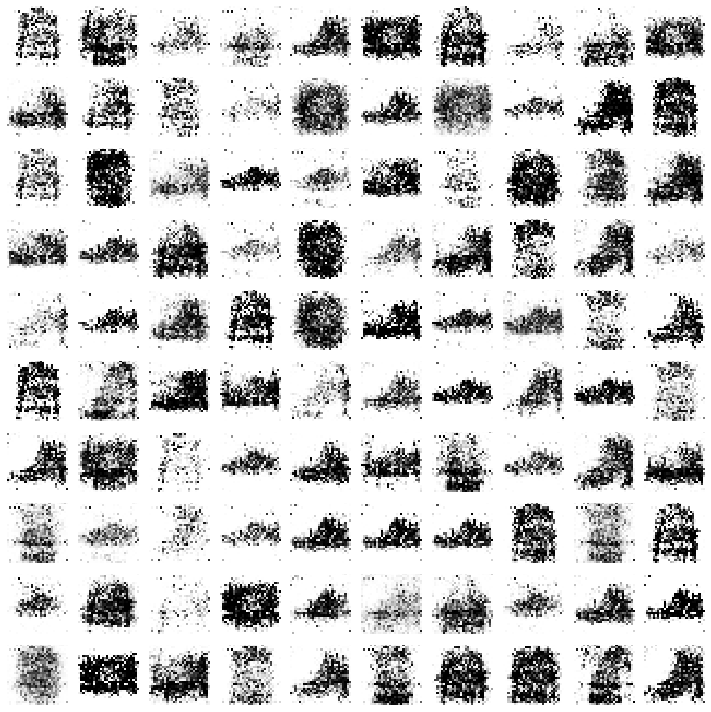

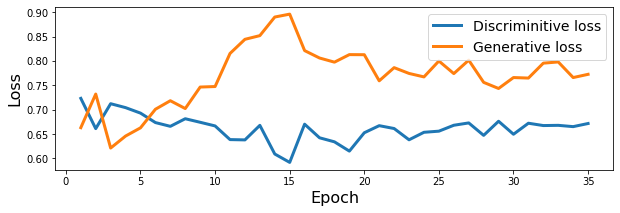

--------------- Epoch 36 ---------------


100%|██████████| 234/234 [00:03<00:00, 65.04it/s]


--------------- Epoch 37 ---------------


100%|██████████| 234/234 [00:03<00:00, 66.00it/s]


--------------- Epoch 38 ---------------


100%|██████████| 234/234 [00:03<00:00, 65.68it/s]


--------------- Epoch 39 ---------------


100%|██████████| 234/234 [00:03<00:00, 65.55it/s]


--------------- Epoch 40 ---------------


100%|██████████| 234/234 [00:03<00:00, 66.02it/s]


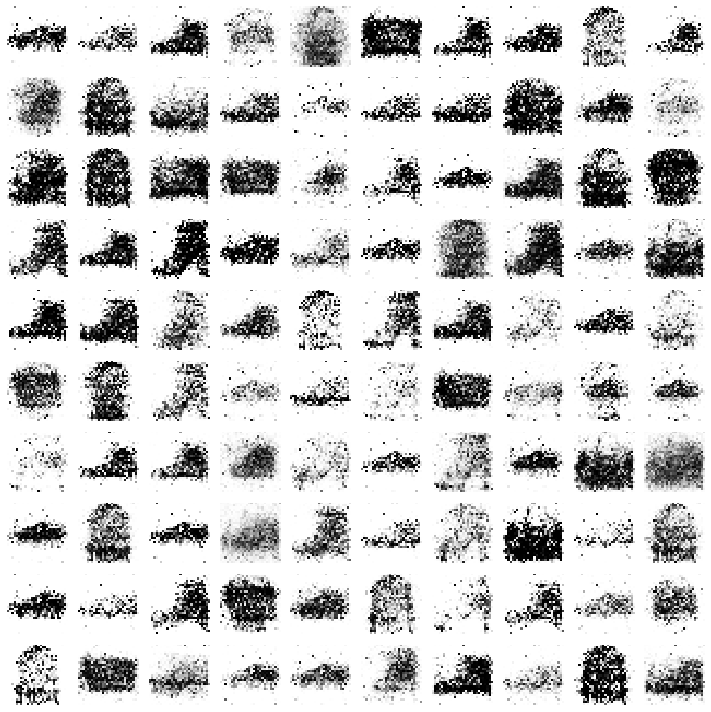

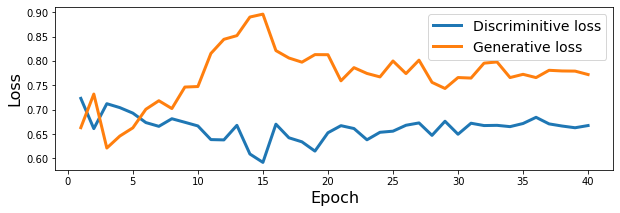

--------------- Epoch 41 ---------------


100%|██████████| 234/234 [00:03<00:00, 64.21it/s]


--------------- Epoch 42 ---------------


100%|██████████| 234/234 [00:03<00:00, 63.78it/s]


--------------- Epoch 43 ---------------


100%|██████████| 234/234 [00:03<00:00, 65.20it/s]


--------------- Epoch 44 ---------------


100%|██████████| 234/234 [00:03<00:00, 64.32it/s]


--------------- Epoch 45 ---------------


100%|██████████| 234/234 [00:03<00:00, 64.12it/s]


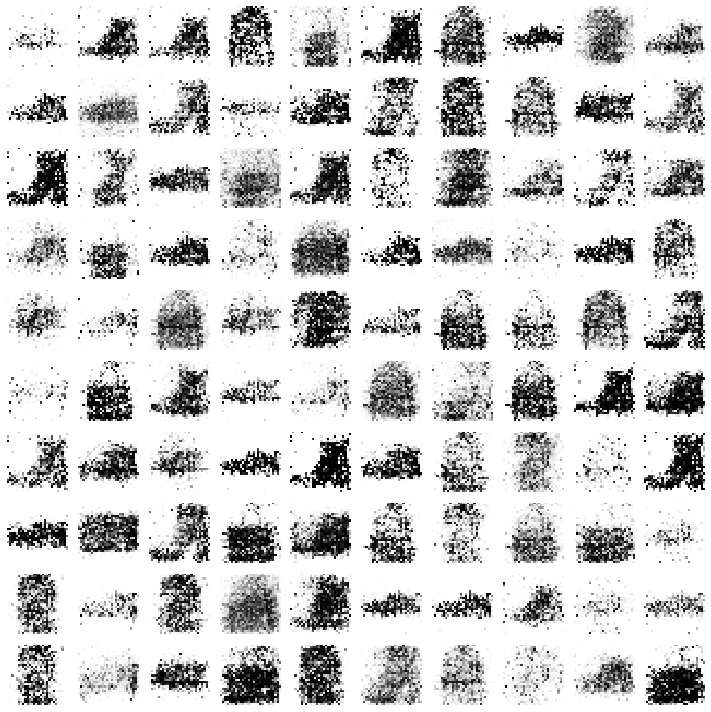

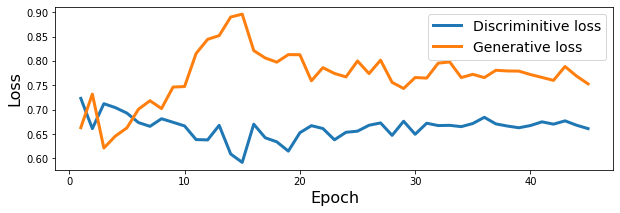

--------------- Epoch 46 ---------------


100%|██████████| 234/234 [00:03<00:00, 63.51it/s]


--------------- Epoch 47 ---------------


100%|██████████| 234/234 [00:03<00:00, 64.16it/s]


--------------- Epoch 48 ---------------


100%|██████████| 234/234 [00:03<00:00, 64.23it/s]


--------------- Epoch 49 ---------------


100%|██████████| 234/234 [00:03<00:00, 64.33it/s]


--------------- Epoch 50 ---------------


100%|██████████| 234/234 [00:03<00:00, 64.06it/s]


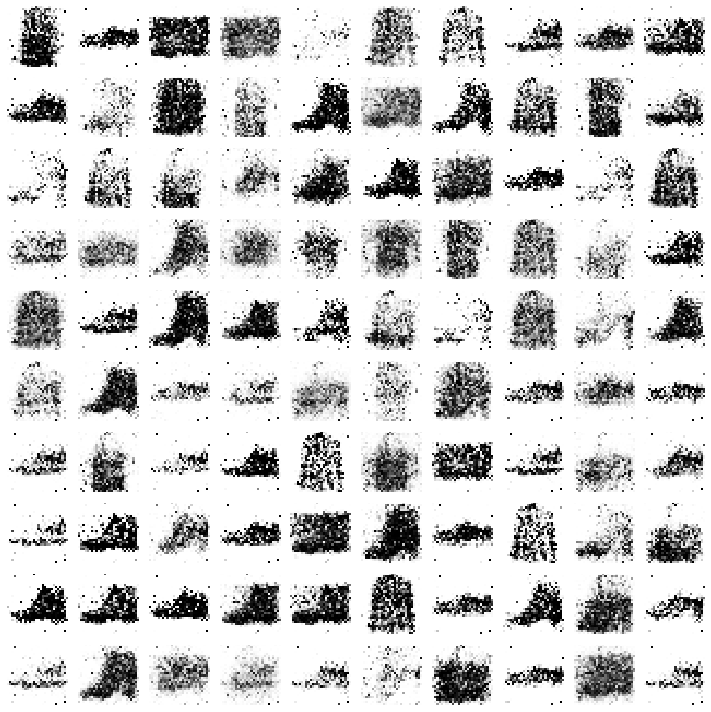

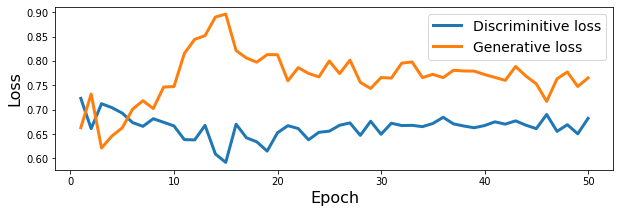

--------------- Epoch 51 ---------------


100%|██████████| 234/234 [00:03<00:00, 64.26it/s]


--------------- Epoch 52 ---------------


100%|██████████| 234/234 [00:03<00:00, 63.52it/s]


--------------- Epoch 53 ---------------


100%|██████████| 234/234 [00:03<00:00, 63.78it/s]


--------------- Epoch 54 ---------------


100%|██████████| 234/234 [00:03<00:00, 62.87it/s]


--------------- Epoch 55 ---------------


100%|██████████| 234/234 [00:03<00:00, 63.87it/s]


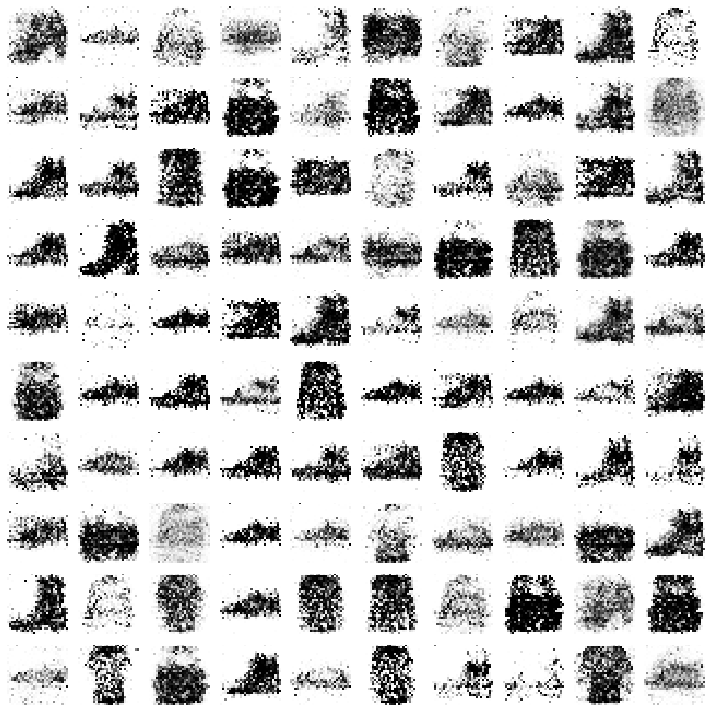

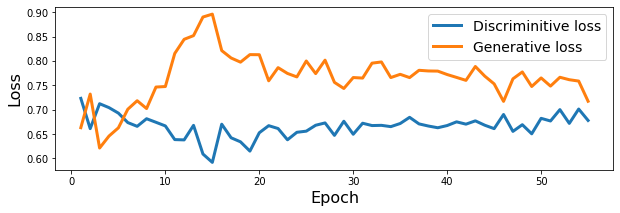

--------------- Epoch 56 ---------------


100%|██████████| 234/234 [00:03<00:00, 59.98it/s]


--------------- Epoch 57 ---------------


100%|██████████| 234/234 [00:03<00:00, 61.21it/s]


--------------- Epoch 58 ---------------


100%|██████████| 234/234 [00:03<00:00, 61.14it/s]


--------------- Epoch 59 ---------------


100%|██████████| 234/234 [00:03<00:00, 62.78it/s]


--------------- Epoch 60 ---------------


100%|██████████| 234/234 [00:03<00:00, 63.22it/s]


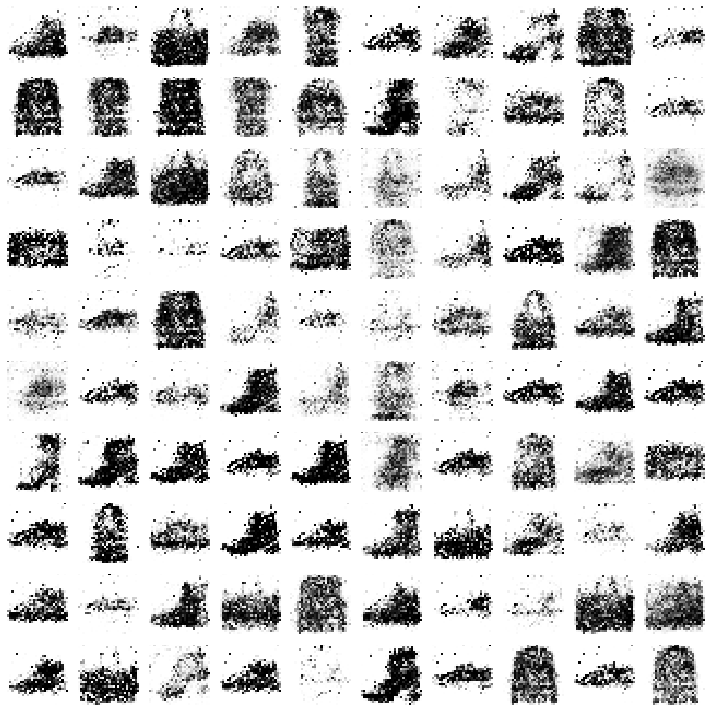

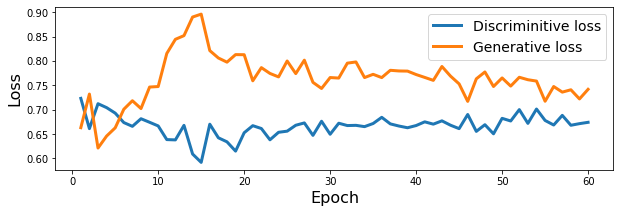

--------------- Epoch 61 ---------------


100%|██████████| 234/234 [00:03<00:00, 60.00it/s]


--------------- Epoch 62 ---------------


100%|██████████| 234/234 [00:03<00:00, 60.02it/s]


--------------- Epoch 63 ---------------


100%|██████████| 234/234 [00:03<00:00, 60.08it/s]


--------------- Epoch 64 ---------------


100%|██████████| 234/234 [00:03<00:00, 60.94it/s]


--------------- Epoch 65 ---------------


100%|██████████| 234/234 [00:03<00:00, 61.06it/s]


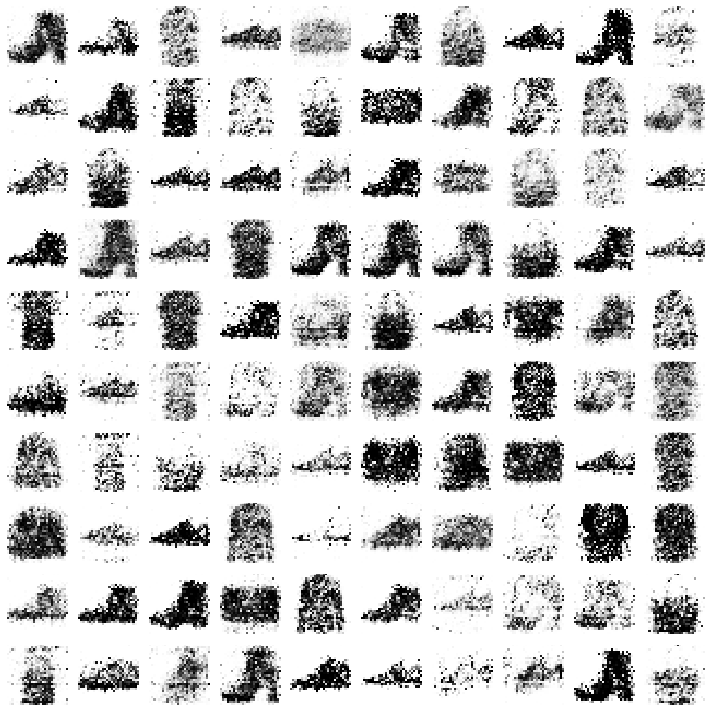

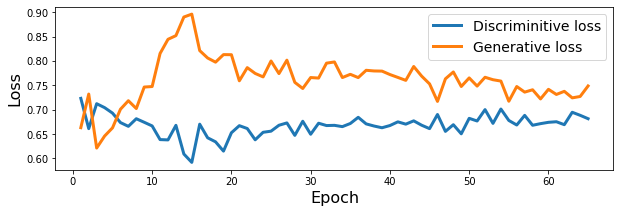

--------------- Epoch 66 ---------------


100%|██████████| 234/234 [00:03<00:00, 58.63it/s]


--------------- Epoch 67 ---------------


100%|██████████| 234/234 [00:03<00:00, 58.57it/s]


--------------- Epoch 68 ---------------


100%|██████████| 234/234 [00:03<00:00, 60.07it/s]


--------------- Epoch 69 ---------------


100%|██████████| 234/234 [00:03<00:00, 59.87it/s]


--------------- Epoch 70 ---------------


100%|██████████| 234/234 [00:03<00:00, 60.24it/s]


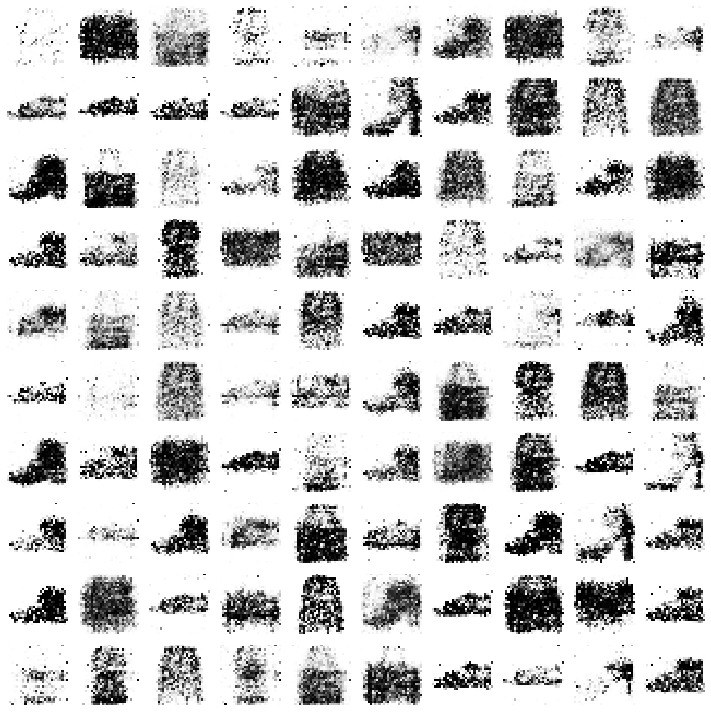

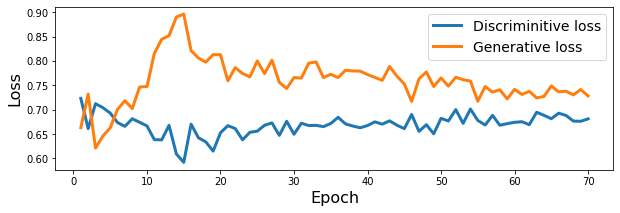

--------------- Epoch 71 ---------------


100%|██████████| 234/234 [00:03<00:00, 60.51it/s]


--------------- Epoch 72 ---------------


100%|██████████| 234/234 [00:03<00:00, 58.79it/s]


--------------- Epoch 73 ---------------


100%|██████████| 234/234 [00:03<00:00, 60.87it/s]


--------------- Epoch 74 ---------------


100%|██████████| 234/234 [00:03<00:00, 60.24it/s]


--------------- Epoch 75 ---------------


100%|██████████| 234/234 [00:03<00:00, 62.61it/s]


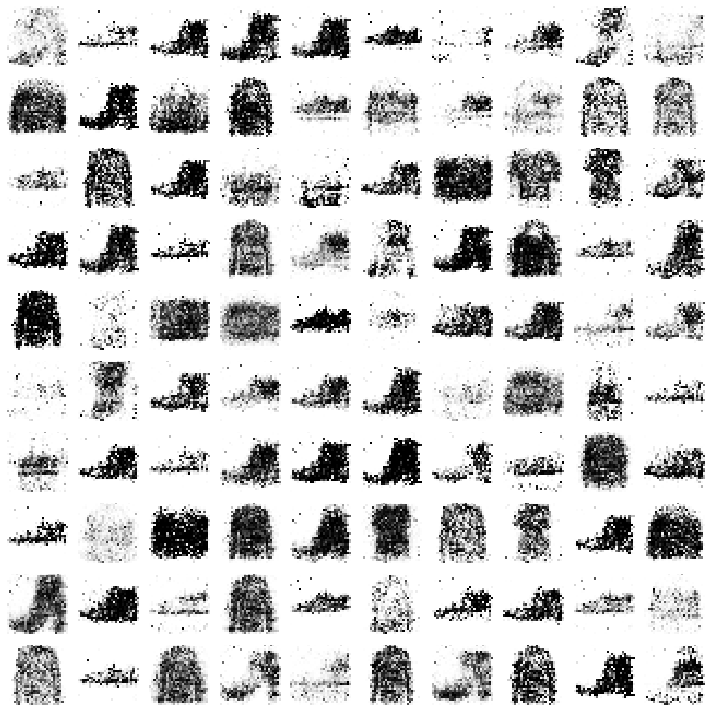

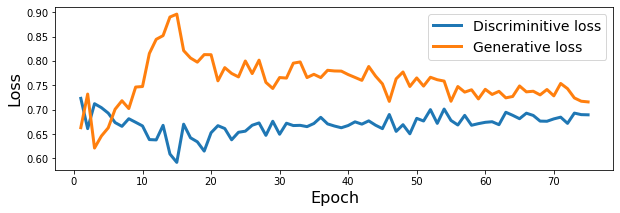

--------------- Epoch 76 ---------------


100%|██████████| 234/234 [00:03<00:00, 59.40it/s]


--------------- Epoch 77 ---------------


100%|██████████| 234/234 [00:03<00:00, 59.98it/s]


--------------- Epoch 78 ---------------


100%|██████████| 234/234 [00:03<00:00, 61.17it/s]


--------------- Epoch 79 ---------------


100%|██████████| 234/234 [00:03<00:00, 60.93it/s]


--------------- Epoch 80 ---------------


100%|██████████| 234/234 [00:03<00:00, 60.54it/s]


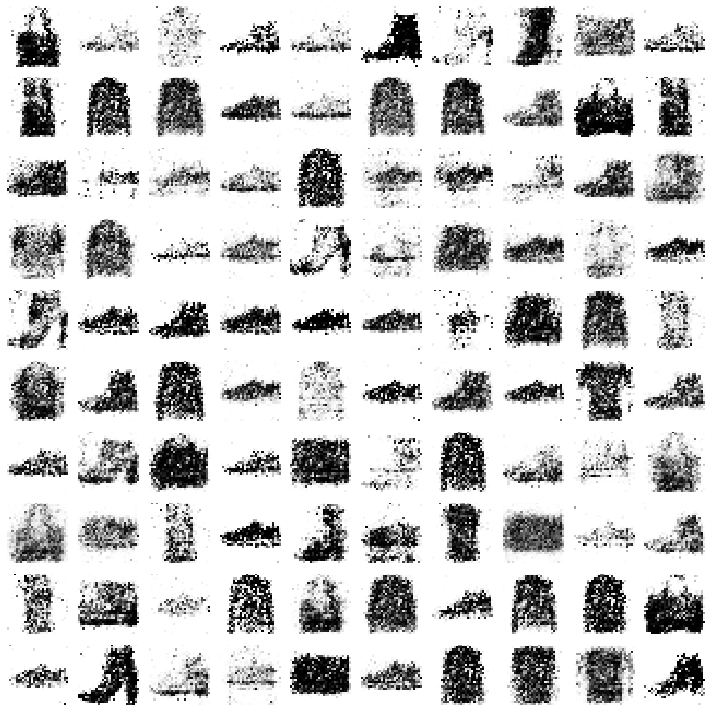

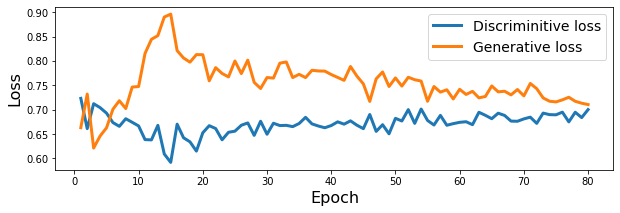

--------------- Epoch 81 ---------------


100%|██████████| 234/234 [00:04<00:00, 58.43it/s]


--------------- Epoch 82 ---------------


100%|██████████| 234/234 [00:03<00:00, 59.52it/s]


--------------- Epoch 83 ---------------


100%|██████████| 234/234 [00:03<00:00, 59.72it/s]


--------------- Epoch 84 ---------------


100%|██████████| 234/234 [00:03<00:00, 60.30it/s]


--------------- Epoch 85 ---------------


100%|██████████| 234/234 [00:03<00:00, 59.87it/s]


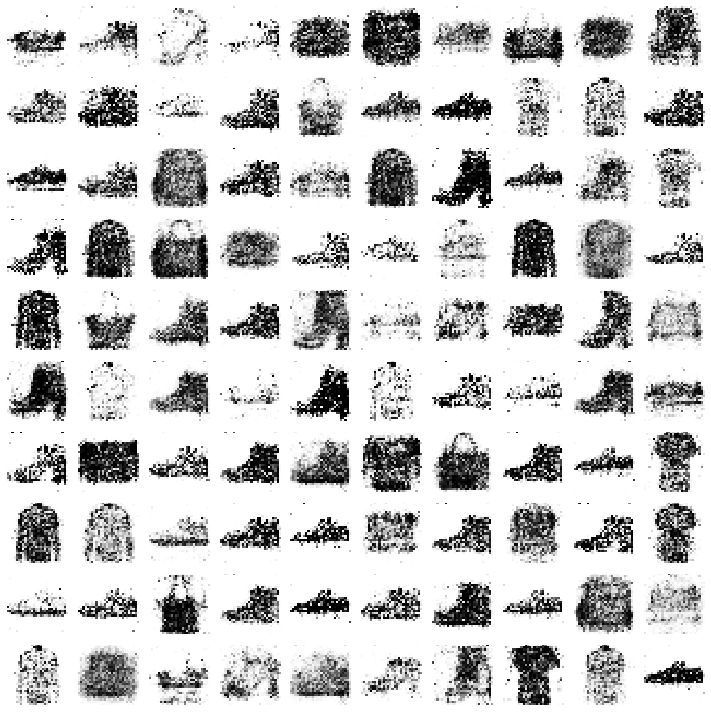

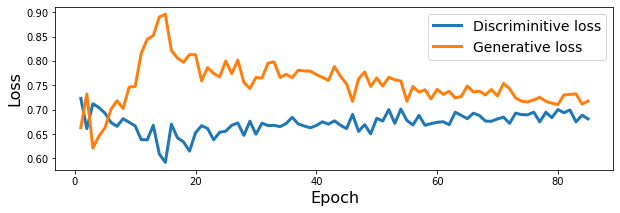

--------------- Epoch 86 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.88it/s]


--------------- Epoch 87 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.32it/s]


--------------- Epoch 88 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.85it/s]


--------------- Epoch 89 ---------------


100%|██████████| 234/234 [00:04<00:00, 56.26it/s]


--------------- Epoch 90 ---------------


100%|██████████| 234/234 [00:04<00:00, 57.01it/s]


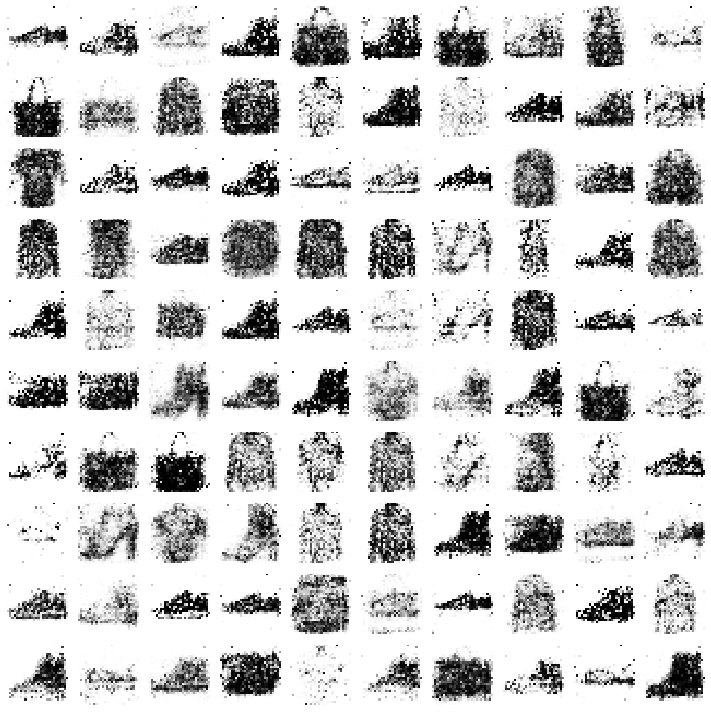

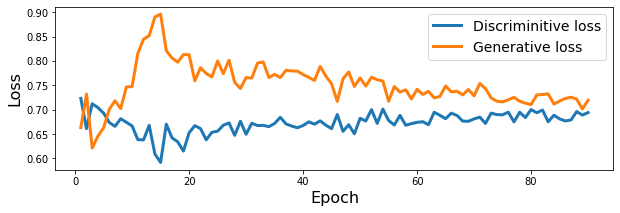

--------------- Epoch 91 ---------------


100%|██████████| 234/234 [00:04<00:00, 57.90it/s]


--------------- Epoch 92 ---------------


100%|██████████| 234/234 [00:04<00:00, 56.20it/s]


--------------- Epoch 93 ---------------


100%|██████████| 234/234 [00:03<00:00, 61.00it/s]


--------------- Epoch 94 ---------------


100%|██████████| 234/234 [00:03<00:00, 60.09it/s]


--------------- Epoch 95 ---------------


100%|██████████| 234/234 [00:03<00:00, 59.16it/s]


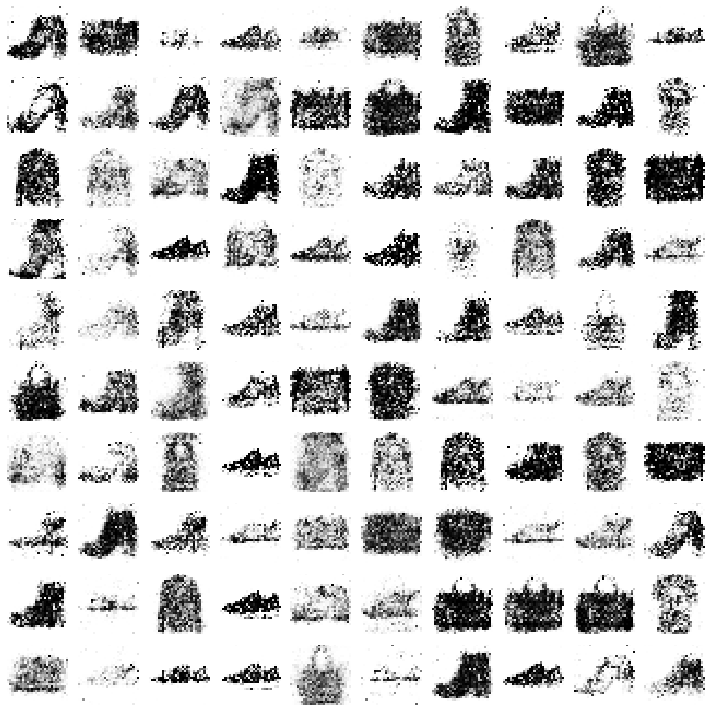

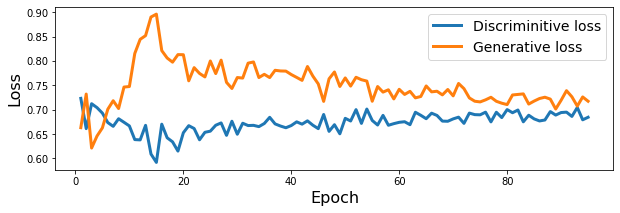

--------------- Epoch 96 ---------------


100%|██████████| 234/234 [00:03<00:00, 59.01it/s]


--------------- Epoch 97 ---------------


100%|██████████| 234/234 [00:03<00:00, 60.26it/s]


--------------- Epoch 98 ---------------


100%|██████████| 234/234 [00:03<00:00, 58.83it/s]


--------------- Epoch 99 ---------------


100%|██████████| 234/234 [00:03<00:00, 60.15it/s]


--------------- Epoch 100 ---------------


100%|██████████| 234/234 [00:03<00:00, 60.72it/s]


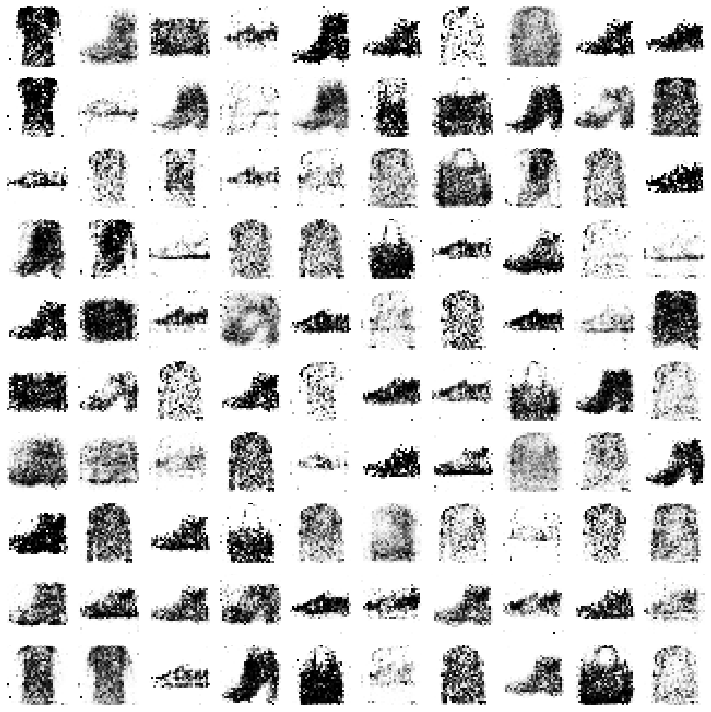

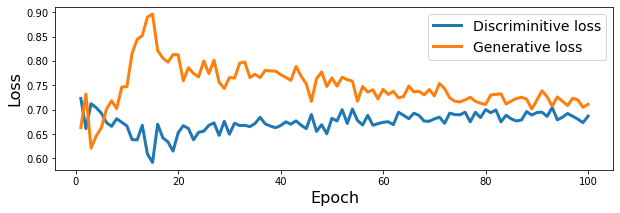

--------------- Epoch 101 ---------------


100%|██████████| 234/234 [00:03<00:00, 59.79it/s]


--------------- Epoch 102 ---------------


100%|██████████| 234/234 [00:04<00:00, 57.72it/s]


--------------- Epoch 103 ---------------


100%|██████████| 234/234 [00:04<00:00, 58.21it/s]


--------------- Epoch 104 ---------------


100%|██████████| 234/234 [00:03<00:00, 59.04it/s]


--------------- Epoch 105 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.75it/s]


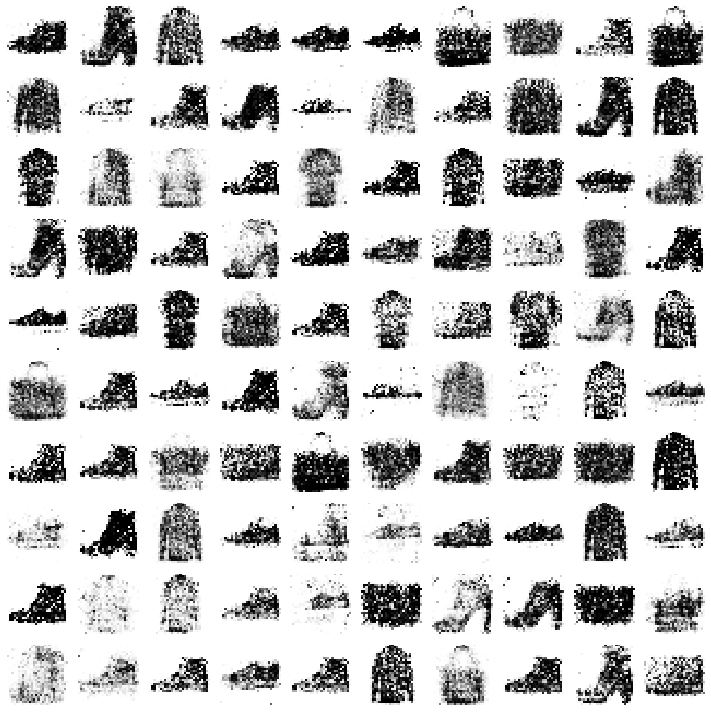

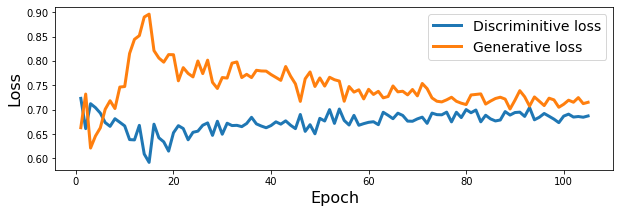

--------------- Epoch 106 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.85it/s]


--------------- Epoch 107 ---------------


100%|██████████| 234/234 [00:04<00:00, 57.24it/s]


--------------- Epoch 108 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.67it/s]


--------------- Epoch 109 ---------------


100%|██████████| 234/234 [00:04<00:00, 57.41it/s]


--------------- Epoch 110 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.97it/s]


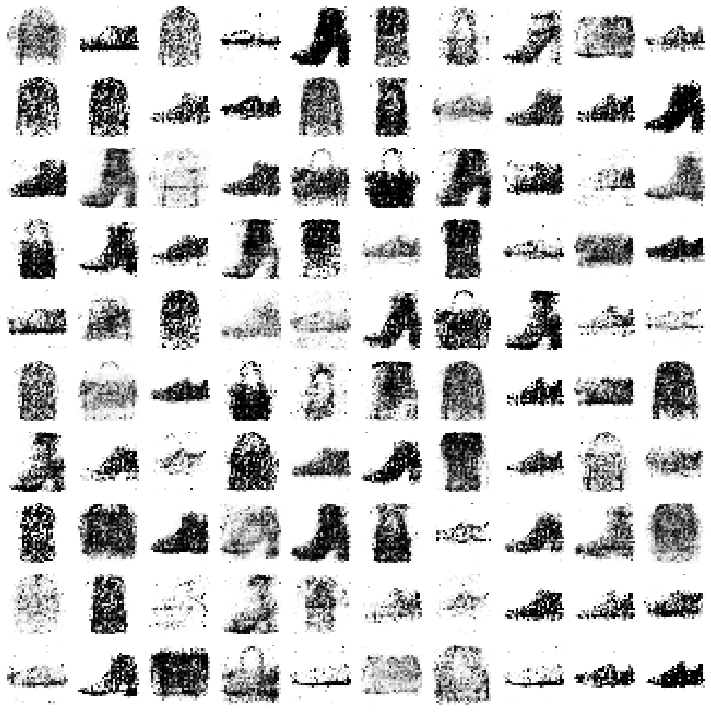

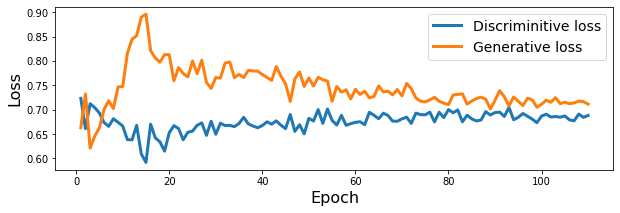

--------------- Epoch 111 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.89it/s]


--------------- Epoch 112 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.79it/s]


--------------- Epoch 113 ---------------


100%|██████████| 234/234 [00:04<00:00, 53.98it/s]


--------------- Epoch 114 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.31it/s]


--------------- Epoch 115 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.99it/s]


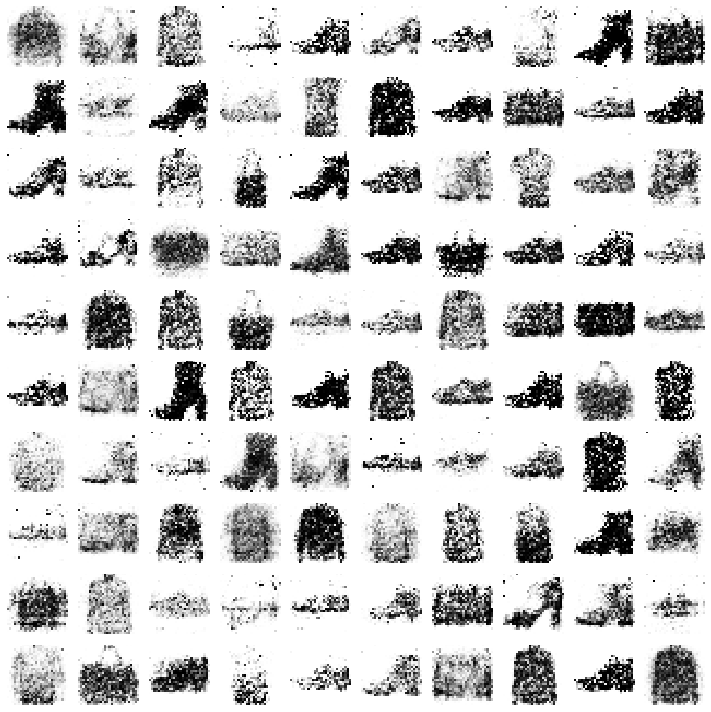

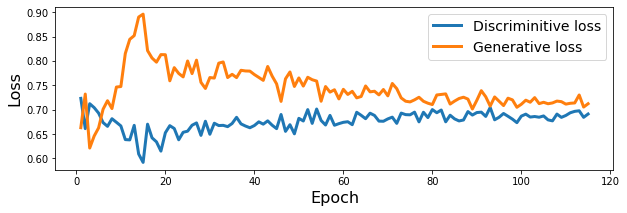

--------------- Epoch 116 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.26it/s]


--------------- Epoch 117 ---------------


100%|██████████| 234/234 [00:04<00:00, 56.59it/s]


--------------- Epoch 118 ---------------


100%|██████████| 234/234 [00:04<00:00, 57.95it/s]


--------------- Epoch 119 ---------------


100%|██████████| 234/234 [00:04<00:00, 56.50it/s]


--------------- Epoch 120 ---------------


100%|██████████| 234/234 [00:04<00:00, 56.27it/s]


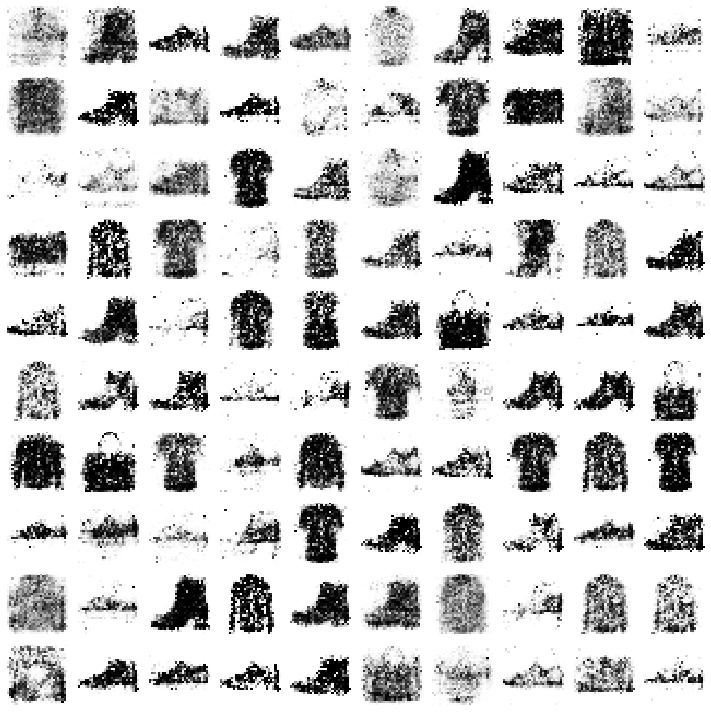

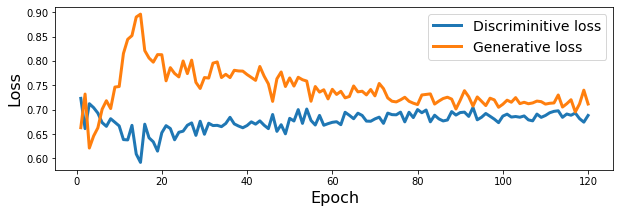

--------------- Epoch 121 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.12it/s]


--------------- Epoch 122 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.61it/s]


--------------- Epoch 123 ---------------


100%|██████████| 234/234 [00:03<00:00, 58.52it/s]


--------------- Epoch 124 ---------------


100%|██████████| 234/234 [00:04<00:00, 56.80it/s]


--------------- Epoch 125 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.88it/s]


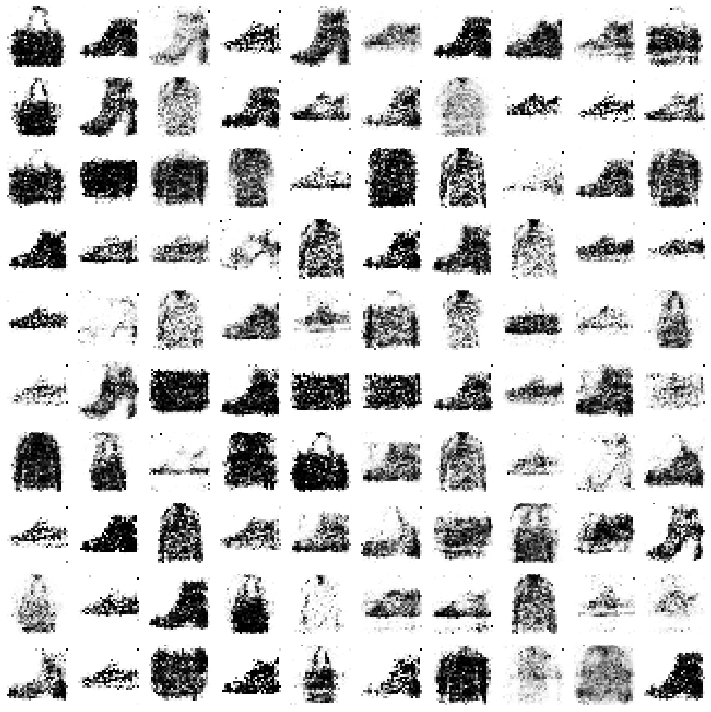

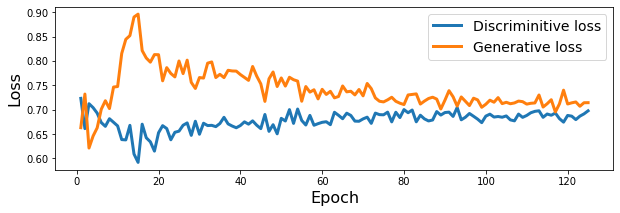

--------------- Epoch 126 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.78it/s]


--------------- Epoch 127 ---------------


100%|██████████| 234/234 [00:04<00:00, 56.43it/s]


--------------- Epoch 128 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.73it/s]


--------------- Epoch 129 ---------------


100%|██████████| 234/234 [00:04<00:00, 57.06it/s]


--------------- Epoch 130 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.80it/s]


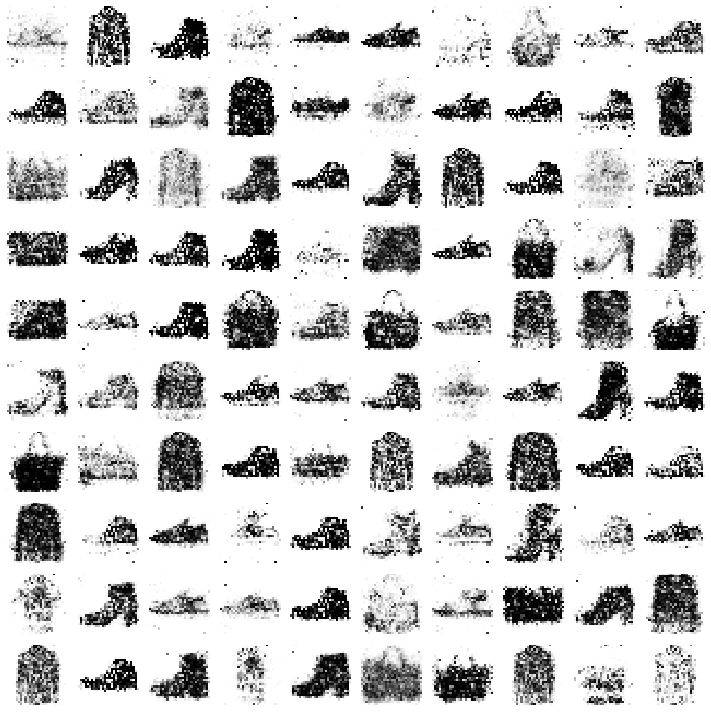

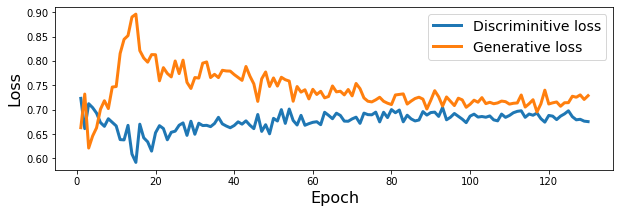

--------------- Epoch 131 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.30it/s]


--------------- Epoch 132 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.95it/s]


--------------- Epoch 133 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.32it/s]


--------------- Epoch 134 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.74it/s]


--------------- Epoch 135 ---------------


100%|██████████| 234/234 [00:04<00:00, 56.58it/s]


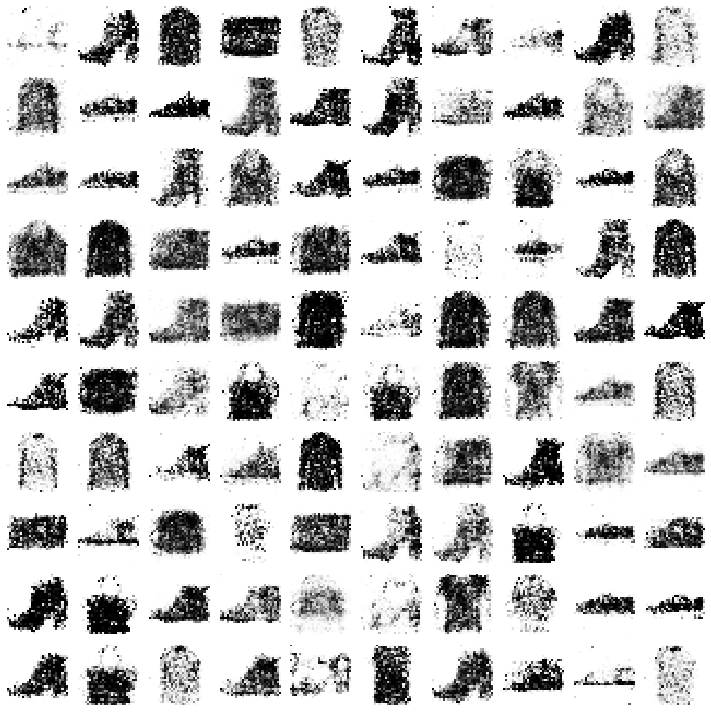

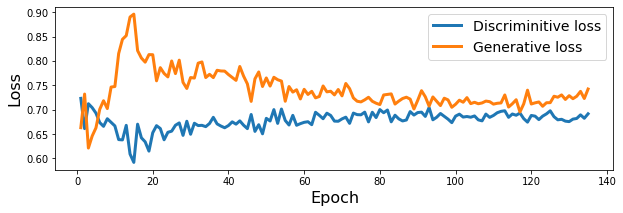

--------------- Epoch 136 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.79it/s]


--------------- Epoch 137 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.55it/s]


--------------- Epoch 138 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.64it/s]


--------------- Epoch 139 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.05it/s]


--------------- Epoch 140 ---------------


100%|██████████| 234/234 [00:04<00:00, 53.76it/s]


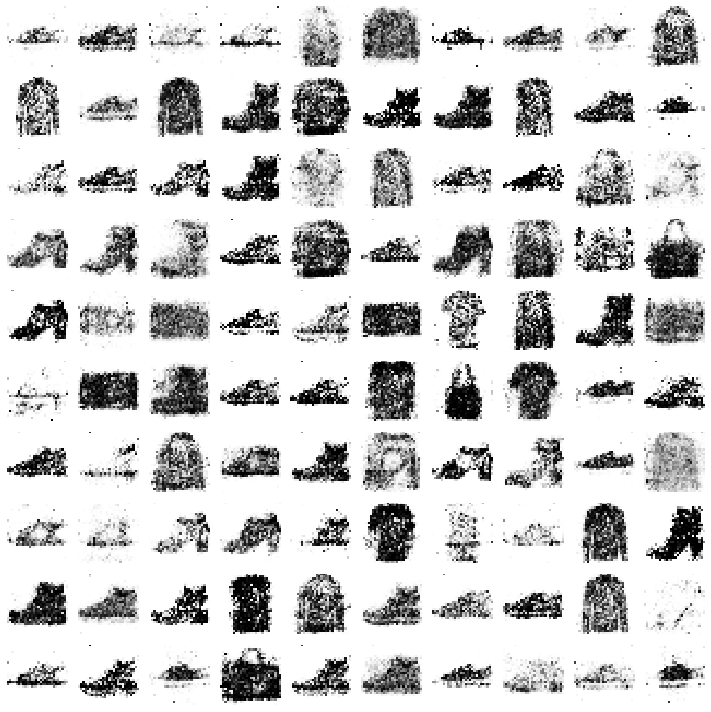

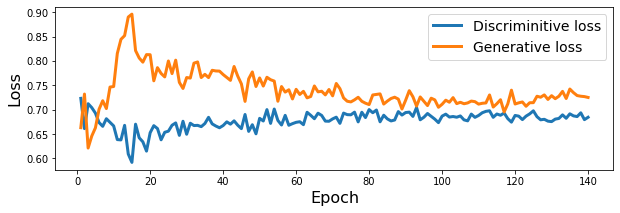

--------------- Epoch 141 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.47it/s]


--------------- Epoch 142 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.91it/s]


--------------- Epoch 143 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.32it/s]


--------------- Epoch 144 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.75it/s]


--------------- Epoch 145 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.65it/s]


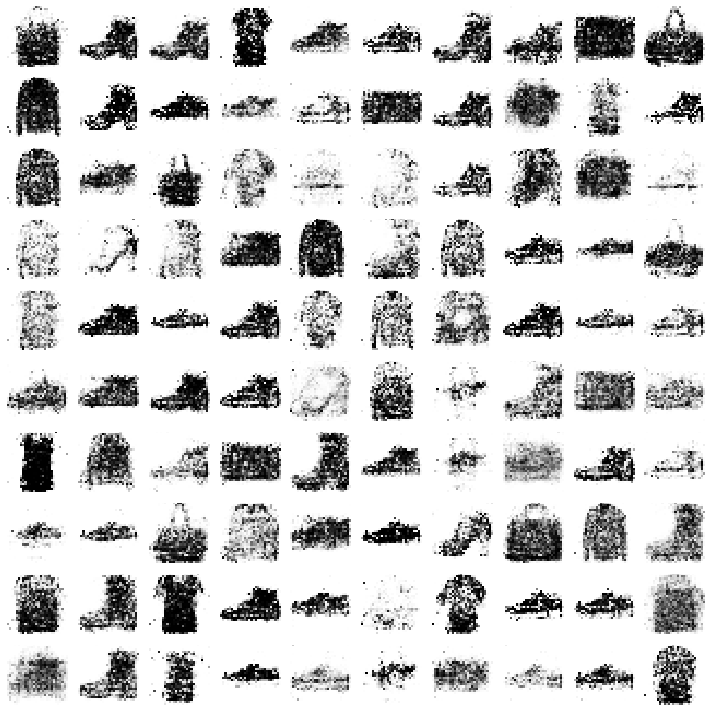

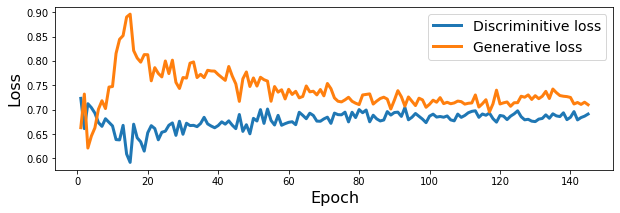

--------------- Epoch 146 ---------------


100%|██████████| 234/234 [00:04<00:00, 53.89it/s]


--------------- Epoch 147 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.13it/s]


--------------- Epoch 148 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.89it/s]


--------------- Epoch 149 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.67it/s]


--------------- Epoch 150 ---------------


100%|██████████| 234/234 [00:04<00:00, 53.92it/s]


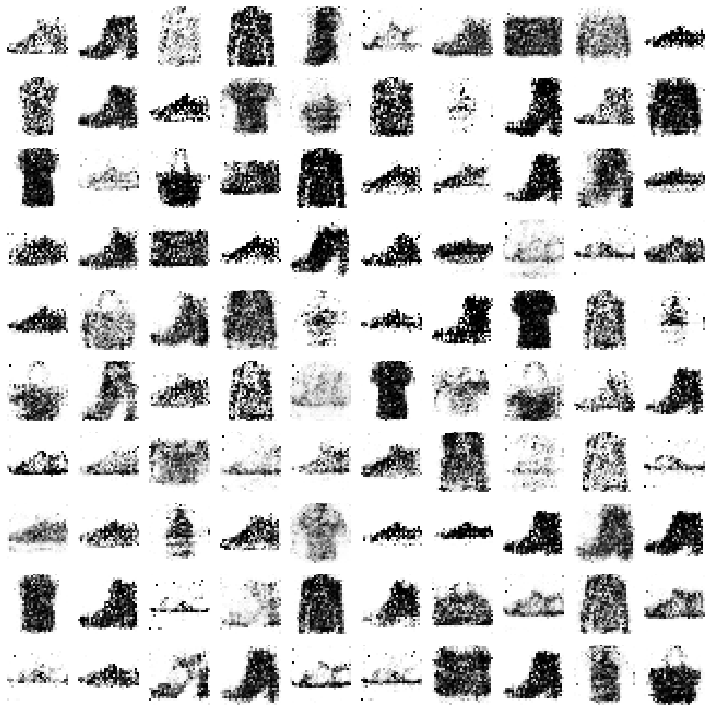

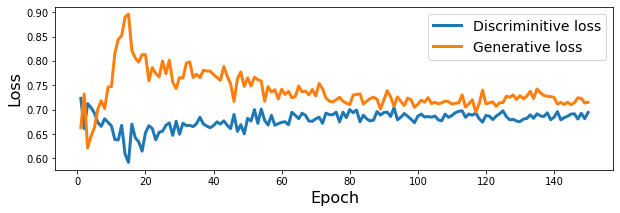

--------------- Epoch 151 ---------------


100%|██████████| 234/234 [00:04<00:00, 53.90it/s]


--------------- Epoch 152 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.66it/s]


--------------- Epoch 153 ---------------


100%|██████████| 234/234 [00:04<00:00, 52.89it/s]


--------------- Epoch 154 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.34it/s]


--------------- Epoch 155 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.46it/s]


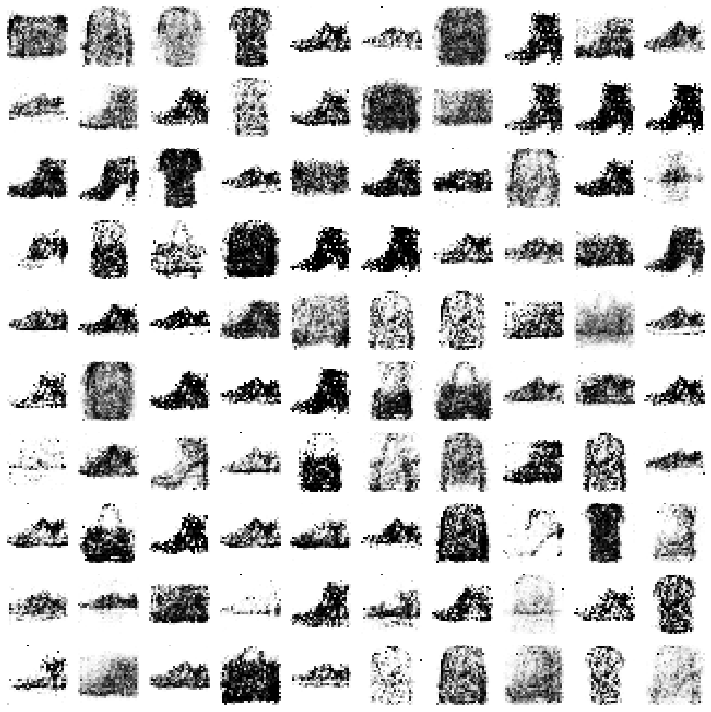

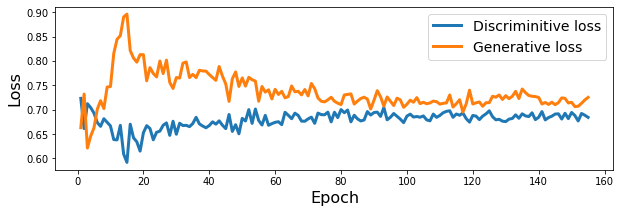

--------------- Epoch 156 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.08it/s]


--------------- Epoch 157 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.57it/s]


--------------- Epoch 158 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.23it/s]


--------------- Epoch 159 ---------------


100%|██████████| 234/234 [00:04<00:00, 51.88it/s]


--------------- Epoch 160 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.46it/s]


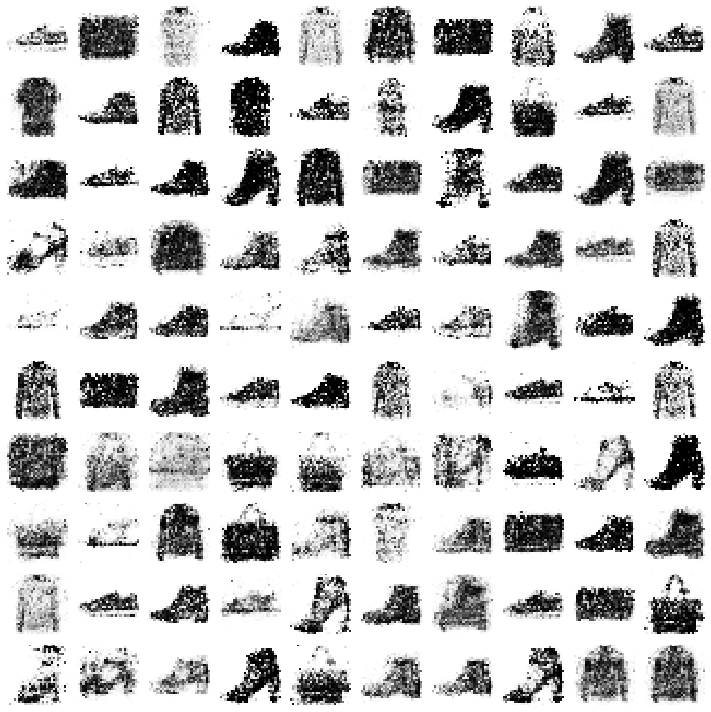

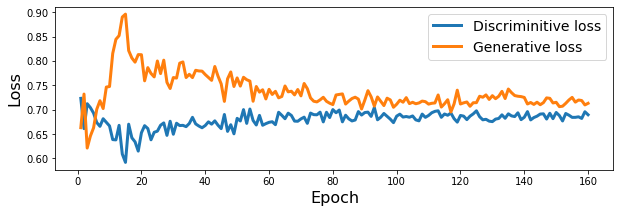

--------------- Epoch 161 ---------------


100%|██████████| 234/234 [00:04<00:00, 51.57it/s]


--------------- Epoch 162 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.68it/s]


--------------- Epoch 163 ---------------


100%|██████████| 234/234 [00:04<00:00, 53.94it/s]


--------------- Epoch 164 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.18it/s]


--------------- Epoch 165 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.19it/s]


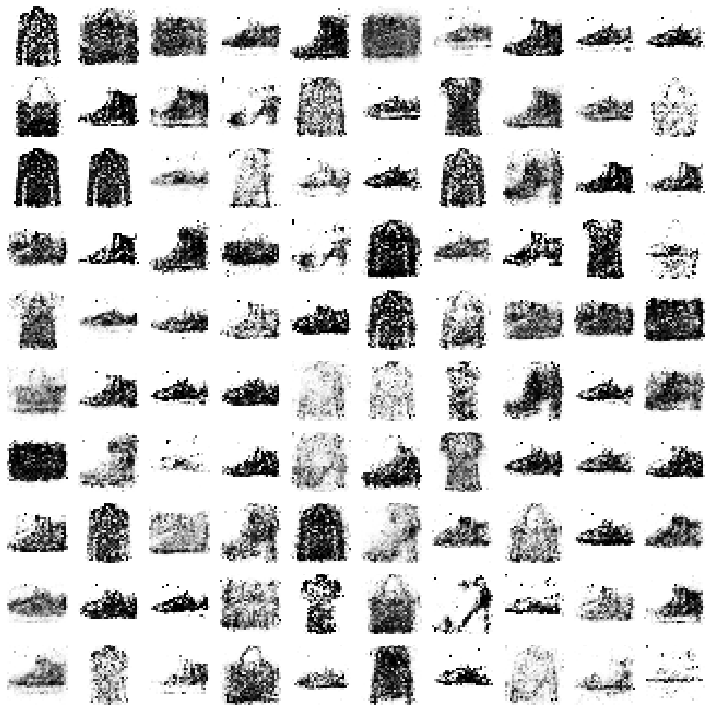

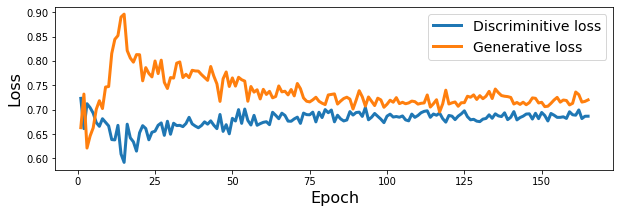

--------------- Epoch 166 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.33it/s]


--------------- Epoch 167 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.98it/s]


--------------- Epoch 168 ---------------


100%|██████████| 234/234 [00:04<00:00, 53.41it/s]


--------------- Epoch 169 ---------------


100%|██████████| 234/234 [00:04<00:00, 53.48it/s]


--------------- Epoch 170 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.86it/s]


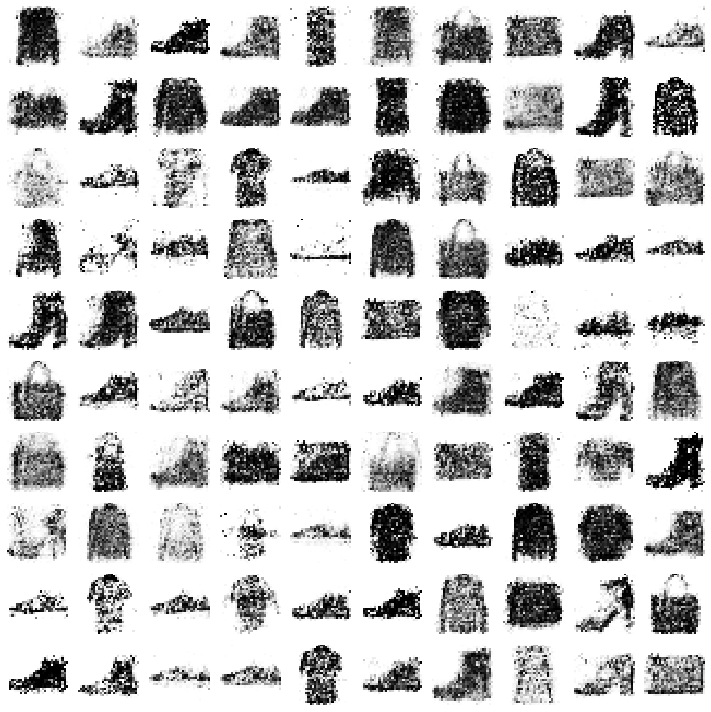

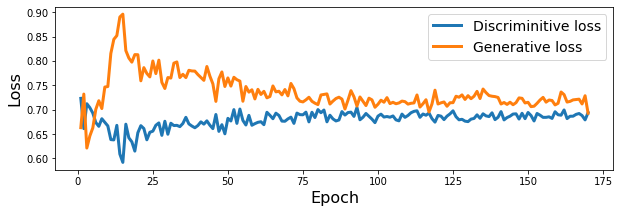

--------------- Epoch 171 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.27it/s]


--------------- Epoch 172 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.48it/s]


--------------- Epoch 173 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.83it/s]


--------------- Epoch 174 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.49it/s]


--------------- Epoch 175 ---------------


100%|██████████| 234/234 [00:04<00:00, 53.82it/s]


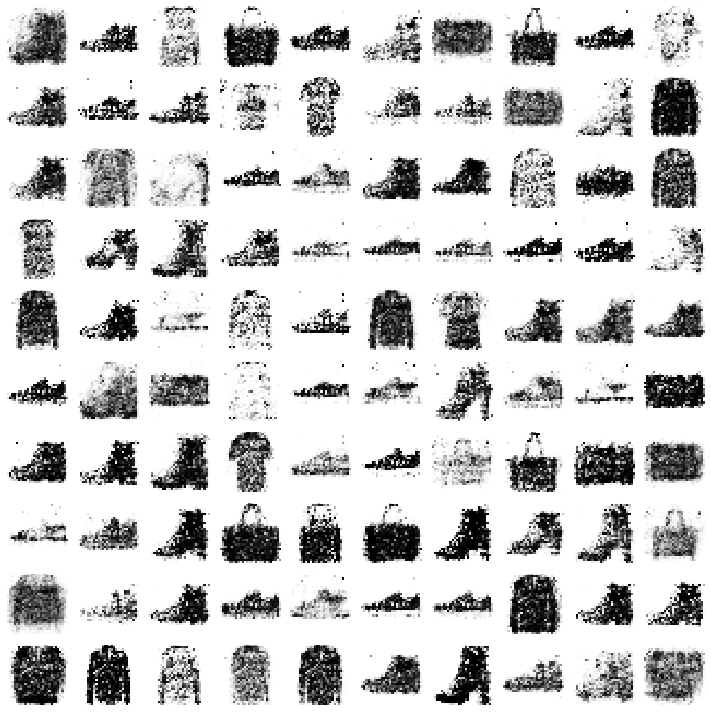

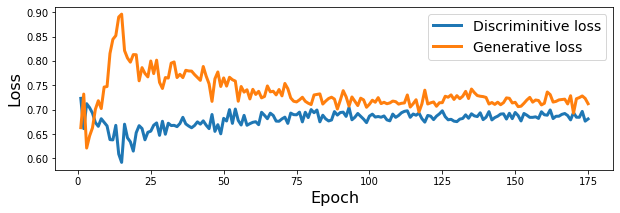

--------------- Epoch 176 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.57it/s]


--------------- Epoch 177 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.16it/s]


--------------- Epoch 178 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.97it/s]


--------------- Epoch 179 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.24it/s]


--------------- Epoch 180 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.68it/s]


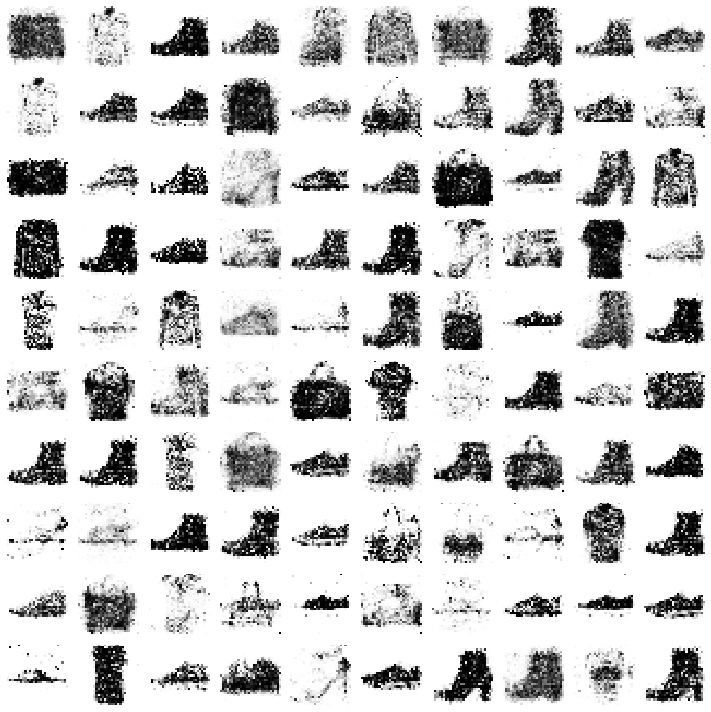

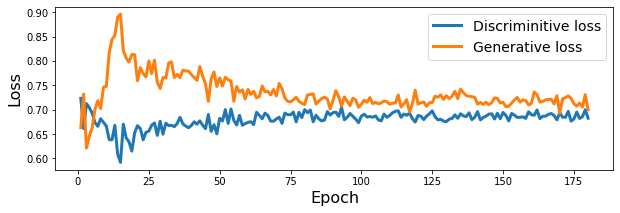

--------------- Epoch 181 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.05it/s]


--------------- Epoch 182 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.19it/s]


--------------- Epoch 183 ---------------


100%|██████████| 234/234 [00:04<00:00, 51.95it/s]


--------------- Epoch 184 ---------------


100%|██████████| 234/234 [00:04<00:00, 53.30it/s]


--------------- Epoch 185 ---------------


100%|██████████| 234/234 [00:04<00:00, 52.70it/s]


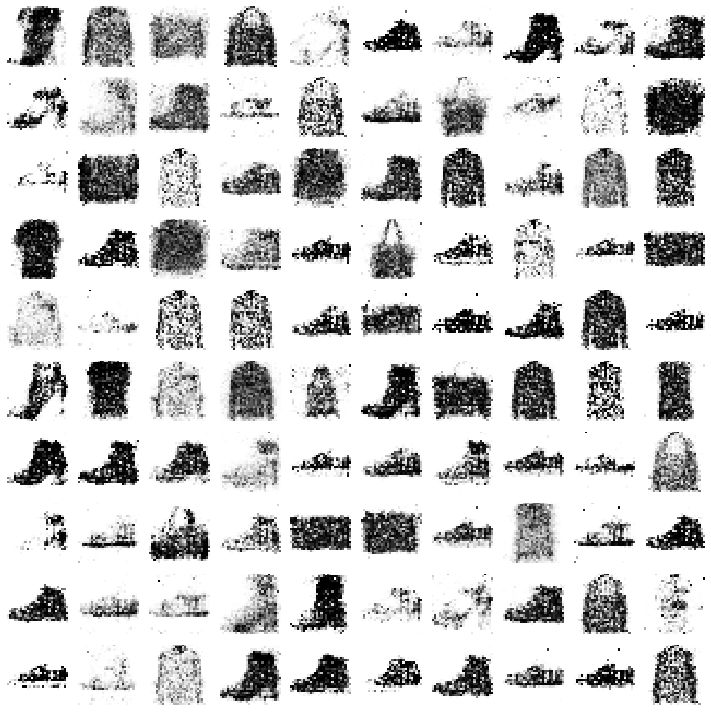

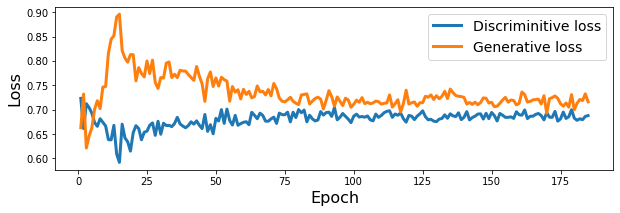

--------------- Epoch 186 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.00it/s]


--------------- Epoch 187 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.67it/s]


--------------- Epoch 188 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.37it/s]


--------------- Epoch 189 ---------------


100%|██████████| 234/234 [00:04<00:00, 55.08it/s]


--------------- Epoch 190 ---------------


100%|██████████| 234/234 [00:04<00:00, 53.72it/s]


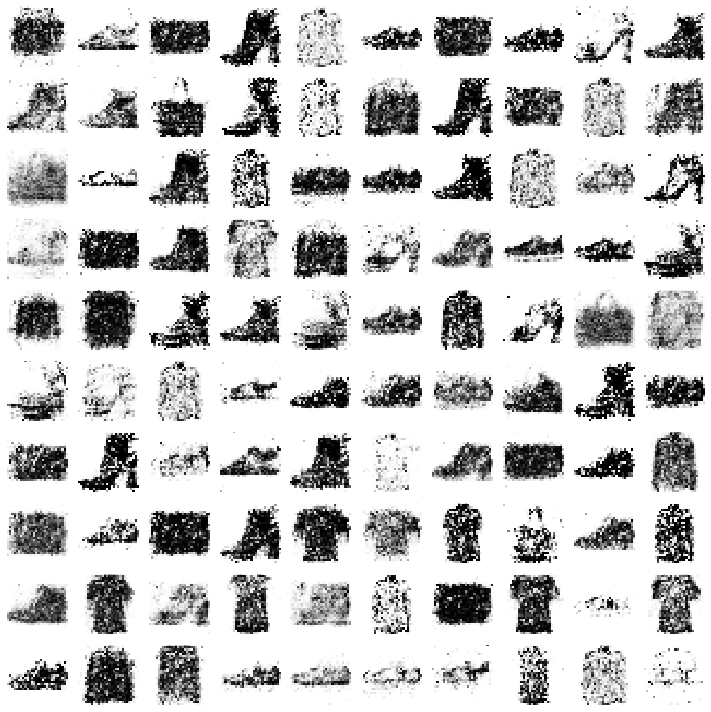

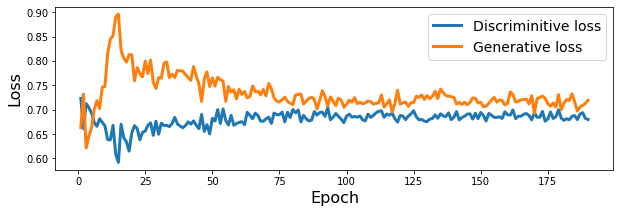

--------------- Epoch 191 ---------------


100%|██████████| 234/234 [00:04<00:00, 53.53it/s]


--------------- Epoch 192 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.20it/s]


--------------- Epoch 193 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.47it/s]


--------------- Epoch 194 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.34it/s]


--------------- Epoch 195 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.29it/s]


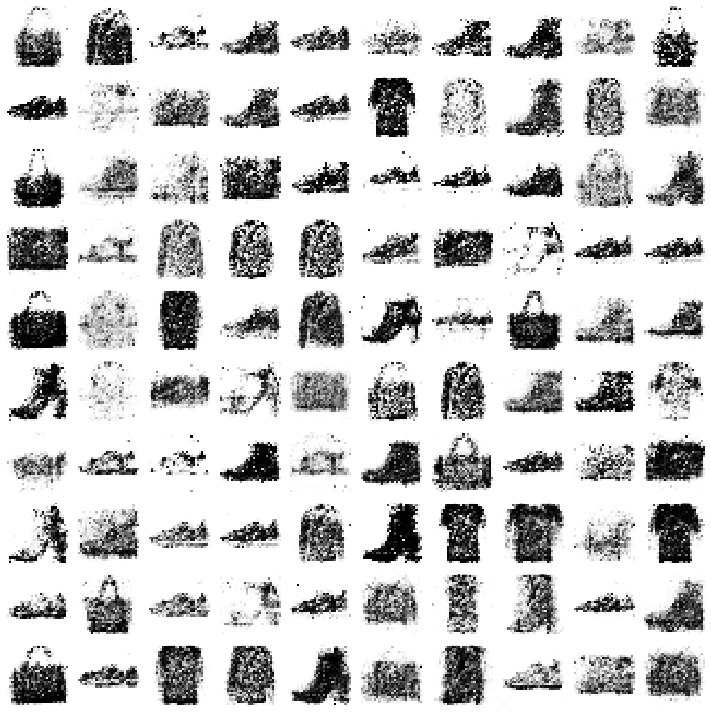

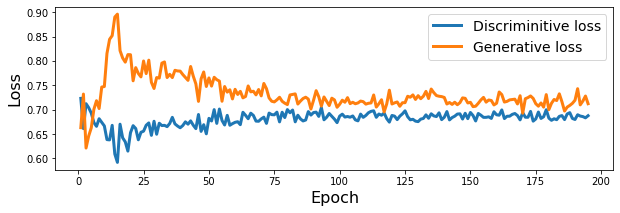

--------------- Epoch 196 ---------------


100%|██████████| 234/234 [00:04<00:00, 53.29it/s]


--------------- Epoch 197 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.32it/s]


--------------- Epoch 198 ---------------


100%|██████████| 234/234 [00:04<00:00, 53.98it/s]


--------------- Epoch 199 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.77it/s]


--------------- Epoch 200 ---------------


100%|██████████| 234/234 [00:04<00:00, 54.64it/s]


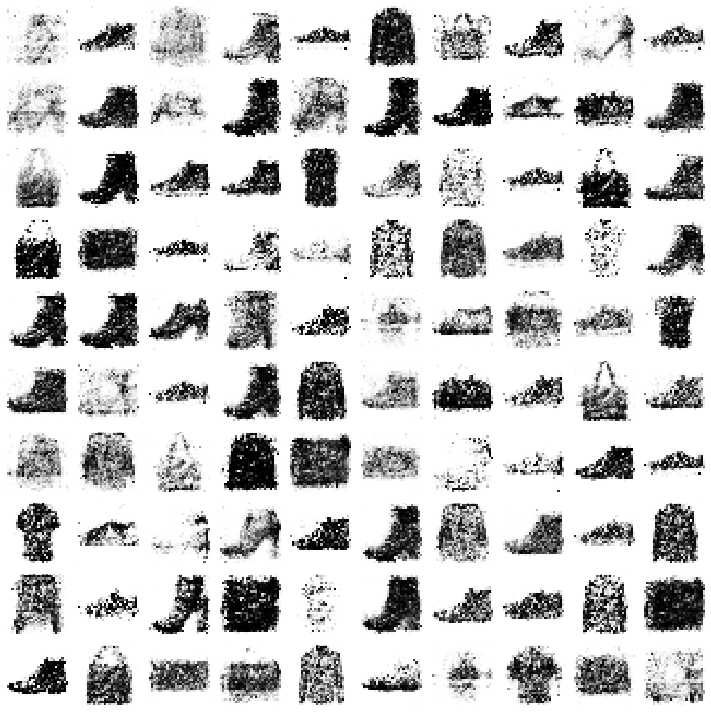

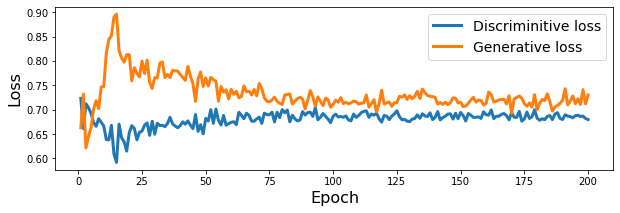

In [38]:
print('Epochs:', epochs)
print('Batch size:', batchSize)
print('Batches per epoch:', batchCount)

for e in range(1, epochs+1):
    print('-'*15, 'Epoch %d' % e, '-'*15)
    for _ in tqdm(range(batchCount)):

        # ** MINI-ENTRENAMIENTO DISCRIMINADOR: **
        # Get a random set of input noise and images
        # Genero entrada aleatoria al generador para 128 imágenes:
        noise = np.random.normal(0, 1, size=[batchSize, randomDim]) # distribución Gaussiana de media 0 y std 1
        # Generate fake images
        # genero 128 (batchSize) imágenes falsas
        generatedImages = generator.predict(noise)

        # cojo al azar 128 (batchSize) imágenes reales
        imageBatch = X_train[np.random.randint(0, len(X_train), size=batchSize)]

        # las 128 primeras imágenes son reales
        # y las 128 siguientes fake
        # 128 REALES + 128 FAKES
        X = np.concatenate([imageBatch, generatedImages])
        
        # Labels for generated and real data (0: FAKE, 1:REAL)
        yDis = batchSize*[0.9] + batchSize*[0.1]
        
        # Train discriminator
        discriminator.trainable = True
        dloss = discriminator.train_on_batch(X, yDis)
        # ** FIN DE MINI-ENTRENAMIENTO **

        
        
        
        # ** MINI-ENTRENAMIENTO GENERADOR: **
        noise = np.random.normal(0, 1, size=[batchSize, randomDim])
        yGen = batchSize*[0.9] # 1: REAL
        discriminator.trainable = False
        gloss = gan.train_on_batch(noise, yGen)
        # ** FIN DE MINI-ENTRENAMIENTO **

    # Store loss of most recent batch from this epoch
    dLosses.append(dloss)
    gLosses.append(gloss)
    
    if (e==1) or ((e%5)==0):
        plotGeneratedImages(e)
        if SAVE_INTERMEDIATE_DATA:
            saveModels(e)
    if (e%5)==0:
        plotLoss(e)

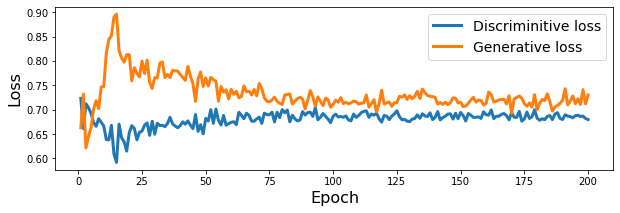

In [39]:
# Plot losses from every epoch
plotLoss(e)

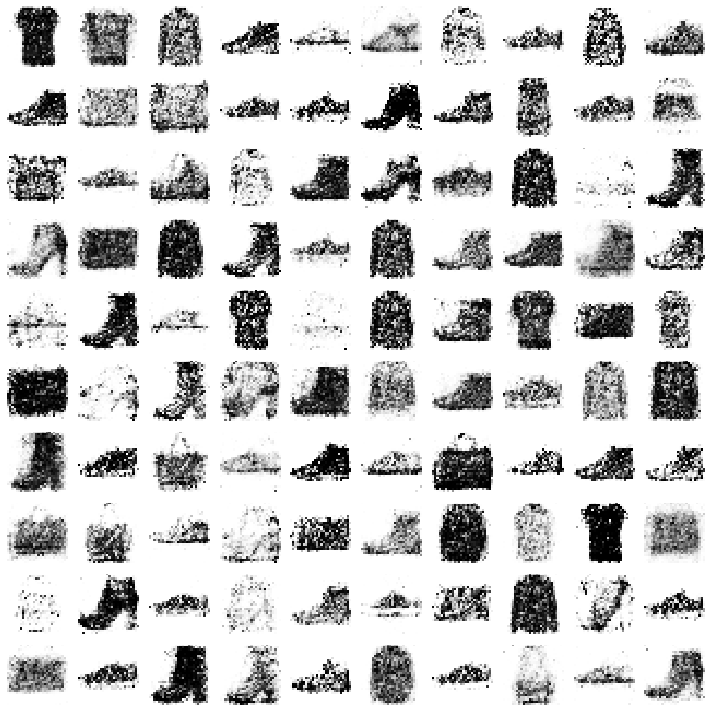

In [40]:
plotGeneratedImages(e+1)

Ahora generamos un conjunto de vectores de entrada a la GAN. Cada vector de entrada tiene **randomDim** componentes:

In [41]:
randomDim

20

In [42]:
# Vamos a mostrar los resultados obtenidos para el conjunto de vectores
# de entrada en una matriz de nfilas * ncols:
nfilas = 20
ncols  = 20

# Inicializo a 0 el conjunto de vectores de entrada a la GAN:
input0 = np.zeros((nfilas*ncols, randomDim))

# Termino de calcular el conjunto de vectores de entrada.
# La idea es que en cada fila las componentes diferentes de cero
# son las mismas, y sus valores cambian de columna a columna:

nvector = 0
for i in range(nfilas):
    # Qué componentes de las randomDim se van a perturbar:
    componentes_pert = range(i,i+1)
    for j,x in enumerate(np.linspace(-4, 4, ncols)):
        input_id = i+0
        input0[nvector][componentes_pert] = x
        nvector = nvector + 1

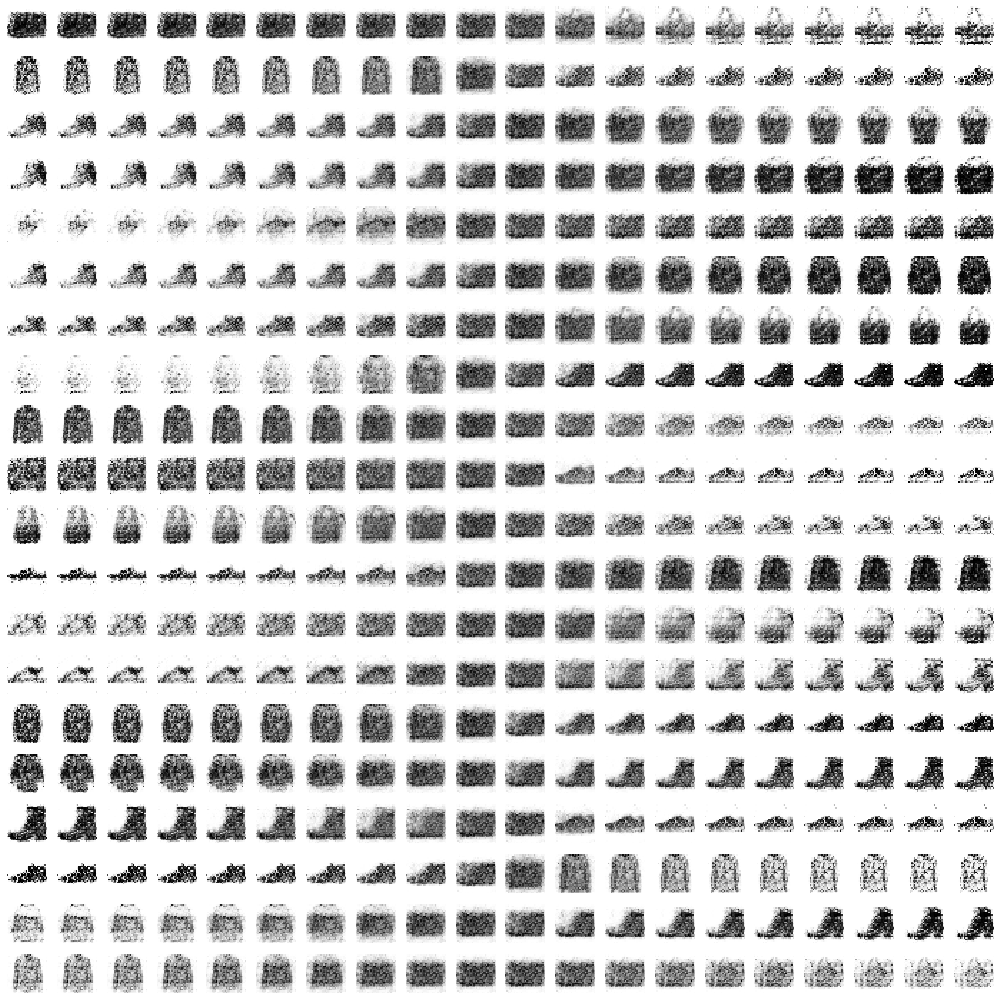

In [43]:
generatedImages = generator.predict(input0)
plotImages(generatedImages, nfilas, ncols, figsize=(14,14))

In [44]:
generatedImages.shape

(400, 784)

In [45]:
# Para grabar las redes a fichero:

generator.save("./generator.h5")
generator.save_weights("./generator_weights.h5")
discriminator.save("./discriminator.h5")
discriminator.save_weights("./discriminator_weights.h5")
gan.save("./gan.h5")
gan.save_weights("./gan_weights.h5")

Para descargar el modelo a local si estamos en Colab:

In [46]:
if COLAB:
    from google.colab import files
    files.download('./generator.h5')
    files.download('./generator_weights.h5')
    files.download('./discriminator.h5')
    files.download('./discriminator_weights.h5')
    files.download('./gan.h5')
    files.download('./gan_weights.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Si quisiésemos realizar **data augmentation** desde otro script, haríamos lo siguiente:

In [ ]:
from keras.models import load_model

model_data_augmentation = load_model("./generator.h5")

/tensorflow-1.15.2/python3.7/keras/engine/saving.py:341: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [ ]:
model_data_augmentation.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 64)                1344      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 64)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               8320      
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 128)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 784)               101136    
Total params: 110,800
Trainable params: 110,800
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_data_augmentation.input_shape

(None, 20)

In [ ]:
numero_patrones_sinteticos = 1000
tam_entrada_generador = model_data_augmentation.input_shape[-1]
input_gen = np.random.randn(numero_patrones_sinteticos, tam_entrada_generador)

patrones_nuevos = model_data_augmentation.predict(input_gen)

In [ ]:
patrones_nuevos.shape

(1000, 784)

In [ ]:
plotImages(patrones_nuevos[:20], nfilas, ncols, figsize=(14,7))

Ejercicio:

- Adaptar el ejercicio a la base de datos CIFAR-10

In [ ]:
from tensorflow.keras.datasets.cifar10 import load_data as load_data_cifar10

In [ ]:
?load_data_cifar10